# **<span style='color:Red'> Telecom Churn case study </span>**

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.
For many incumbent operators, retaining high profitable customers is the number one business goal.
To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.
  In this project, we have to analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

In [1]:
# suppressing warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# importing libraries
import numpy as np
import pandas as pd

# visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# To display all the columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows',None)

## 1: Reading and Understanding the data

In [4]:
# Read the csv file using pandas
data=pd.read_csv("telecom_churn_data.csv")
data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [5]:
data.shape

(99999, 226)

In [6]:
data.info(verbose=True,show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #    Column                    Non-Null Count  Dtype  
---   ------                    --------------  -----  
 0    mobile_number             99999 non-null  int64  
 1    circle_id                 99999 non-null  int64  
 2    loc_og_t2o_mou            98981 non-null  float64
 3    std_og_t2o_mou            98981 non-null  float64
 4    loc_ic_t2o_mou            98981 non-null  float64
 5    last_date_of_month_6      99999 non-null  object 
 6    last_date_of_month_7      99398 non-null  object 
 7    last_date_of_month_8      98899 non-null  object 
 8    last_date_of_month_9      98340 non-null  object 
 9    arpu_6                    99999 non-null  float64
 10   arpu_7                    99999 non-null  float64
 11   arpu_8                    99999 non-null  float64
 12   arpu_9                    99999 non-null  float64
 13   onnet_mou_6               96062 non-null  fl

In [7]:
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
mobile_number,99999.0,NaN,NaN,NaN,7001207270.387544,695669.38629,7000000074.0,7000606232.5,7001204632.0,7001812030.5,7002410905.0
circle_id,99999.0,NaN,NaN,NaN,109.0,0.0,109.0,109.0,109.0,109.0,109.0
loc_og_t2o_mou,98981.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std_og_t2o_mou,98981.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
loc_ic_t2o_mou,98981.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
last_date_of_month_6,99999,1,6/30/2014,99999,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last_date_of_month_7,99398,1,7/31/2014,99398,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last_date_of_month_8,98899,1,8/31/2014,98899,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last_date_of_month_9,98340,1,9/30/2014,98340,NaN,NaN,NaN,NaN,NaN,NaN,NaN
arpu_6,99999.0,NaN,NaN,NaN,282.987358,328.43977,-2258.709,93.4115,197.704,371.06,27731.088


Inferences:
- Only date columns are with data type object, which has to be converted as datetime.
- Many columns have Nan values
- arpu has negative value as minimum
- total_rech_num - count columns
- Few columns that might be relevant are aon,av_rech_amt_data for all months,date_of_last_rech,total_rech_amt

The dataset contains customer-level information for a span of four consecutive months - June, July, August and September. The months are encoded as 6, 7, 8 and 9, respectively. 
The business objective is to predict the churn in the last (i.e. the ninth) month using the data (features) from the first three months.

## 1.1 Handle missing value columns

In [8]:
missing_val = data.isnull().mean().sort_values(ascending=False)*100
missing_val

arpu_3g_6                   74.846748
night_pck_user_6            74.846748
total_rech_data_6           74.846748
arpu_2g_6                   74.846748
max_rech_data_6             74.846748
fb_user_6                   74.846748
av_rech_amt_data_6          74.846748
date_of_last_rech_data_6    74.846748
count_rech_2g_6             74.846748
count_rech_3g_6             74.846748
date_of_last_rech_data_7    74.428744
total_rech_data_7           74.428744
fb_user_7                   74.428744
max_rech_data_7             74.428744
night_pck_user_7            74.428744
count_rech_2g_7             74.428744
av_rech_amt_data_7          74.428744
arpu_2g_7                   74.428744
count_rech_3g_7             74.428744
arpu_3g_7                   74.428744
total_rech_data_9           74.077741
count_rech_3g_9             74.077741
fb_user_9                   74.077741
max_rech_data_9             74.077741
arpu_3g_9                   74.077741
date_of_last_rech_data_9    74.077741
night_pck_us

Inferences:
- Many columns have missing values greater than 70%. Deleting those columns with high percentage of missing values.

In [9]:
#Deleting those columns with more tahn 70% of missing values
to_delete = list(missing_val[missing_val>70].index)
print('Number of columns with more tahn 70% of missing values:',len(to_delete))
data.drop(labels=to_delete,axis=1,inplace=True)
data.shape


Number of columns with more tahn 70% of missing values: 40


(99999, 186)

In [10]:
missing_val = data.isnull().mean().sort_values(ascending=False)*100
missing_val = missing_val[missing_val>0] 
missing_val

loc_og_t2m_mou_9        7.745077
loc_ic_t2m_mou_9        7.745077
offnet_mou_9            7.745077
std_ic_t2f_mou_9        7.745077
roam_ic_mou_9           7.745077
std_og_t2t_mou_9        7.745077
roam_og_mou_9           7.745077
std_ic_t2m_mou_9        7.745077
loc_og_t2t_mou_9        7.745077
std_ic_t2o_mou_9        7.745077
loc_og_mou_9            7.745077
std_ic_t2t_mou_9        7.745077
isd_og_mou_9            7.745077
loc_ic_t2f_mou_9        7.745077
loc_og_t2c_mou_9        7.745077
loc_og_t2f_mou_9        7.745077
loc_ic_t2t_mou_9        7.745077
std_og_t2m_mou_9        7.745077
spl_ic_mou_9            7.745077
std_ic_mou_9            7.745077
ic_others_9             7.745077
std_og_mou_9            7.745077
isd_ic_mou_9            7.745077
spl_og_mou_9            7.745077
onnet_mou_9             7.745077
std_og_t2c_mou_9        7.745077
loc_ic_mou_9            7.745077
og_others_9             7.745077
std_og_t2f_mou_9        7.745077
std_og_t2t_mou_8        5.378054
std_og_t2c

Few columns have excat same number of missing values. These columns might be logically related and have null values for the same instance. 

In [11]:
# Filter out indexes of rows with missing values
miss_indexes= list(data.index[data.isnull().any(axis=1)])

In [12]:
data.filter(items=miss_indexes,axis=0).head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,30.13,1.32,5.75,0.00,83.57,150.76,109.61,0.0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968,30.40,0.00,101.20,3.58
7,7000701601,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,NaN,453.43,567.16,325.91,NaN,16.23,33.49,31.64,NaN,23.74,12.59,38.06,NaN,51.39,31.38,40.28,NaN,308.63,447.38,162.28,NaN,62.13,55.14,53.23,NaN,0.0,0.00,0.0,NaN,422.16,533.91,255.79,NaN,4.30,23.29,12.01,NaN,49.89,31.76,49.14,NaN,6.66,20.08,16.68,NaN,0.0,0.0,0.0,NaN,60.86,75.14,77.84,NaN,0.0,0.18,10.01,NaN,4.50,0.00

In [13]:
# columns with missing value greater than 7%
missing_val[missing_val>7]

loc_og_t2m_mou_9    7.745077
loc_ic_t2m_mou_9    7.745077
offnet_mou_9        7.745077
std_ic_t2f_mou_9    7.745077
roam_ic_mou_9       7.745077
std_og_t2t_mou_9    7.745077
roam_og_mou_9       7.745077
std_ic_t2m_mou_9    7.745077
loc_og_t2t_mou_9    7.745077
std_ic_t2o_mou_9    7.745077
loc_og_mou_9        7.745077
std_ic_t2t_mou_9    7.745077
isd_og_mou_9        7.745077
loc_ic_t2f_mou_9    7.745077
loc_og_t2c_mou_9    7.745077
loc_og_t2f_mou_9    7.745077
loc_ic_t2t_mou_9    7.745077
std_og_t2m_mou_9    7.745077
spl_ic_mou_9        7.745077
std_ic_mou_9        7.745077
ic_others_9         7.745077
std_og_mou_9        7.745077
isd_ic_mou_9        7.745077
spl_og_mou_9        7.745077
onnet_mou_9         7.745077
std_og_t2c_mou_9    7.745077
loc_ic_mou_9        7.745077
og_others_9         7.745077
std_og_t2f_mou_9    7.745077
dtype: float64

All columns listed above are from 9th month. As for this case study all 9th month data is considered to be in churn phase, we will be dropping attributes related to 9th month once the target column is derived. So here we are not dealing above listed null valued columns. 
There are no null values for total_ic_mou_9,total_og_mou_9,vol_2g_mb_9 and vol_3g_mb_9 which has to be used to derive target column.


In [14]:
# Get the columns related to 9th month

data_cols_9 = [cols for cols in data.columns if cols.endswith('9')]
data_cols_9 = data_cols_9 + ['sep_vbc_3g']
data_9 = data[data_cols_9]

In [15]:
# Get missing value cols of 9th month
missing_val_9 = data_9.isnull().mean().sort_values(ascending=False)*100
missing_val_9 = missing_val_9[missing_val_9>0]
missing_val_9

loc_ic_t2f_mou_9        7.745077
spl_ic_mou_9            7.745077
std_ic_mou_9            7.745077
std_ic_t2o_mou_9        7.745077
std_ic_t2f_mou_9        7.745077
std_ic_t2m_mou_9        7.745077
std_ic_t2t_mou_9        7.745077
loc_ic_mou_9            7.745077
ic_others_9             7.745077
loc_ic_t2m_mou_9        7.745077
loc_ic_t2t_mou_9        7.745077
og_others_9             7.745077
spl_og_mou_9            7.745077
isd_og_mou_9            7.745077
std_og_mou_9            7.745077
std_og_t2c_mou_9        7.745077
std_og_t2f_mou_9        7.745077
std_og_t2m_mou_9        7.745077
std_og_t2t_mou_9        7.745077
loc_og_mou_9            7.745077
loc_og_t2c_mou_9        7.745077
loc_og_t2f_mou_9        7.745077
loc_og_t2m_mou_9        7.745077
loc_og_t2t_mou_9        7.745077
roam_og_mou_9           7.745077
roam_ic_mou_9           7.745077
offnet_mou_9            7.745077
onnet_mou_9             7.745077
isd_ic_mou_9            7.745077
date_of_last_rech_9     4.760048
last_date_

In [16]:
# columns with missing value less than 7%
missing_val[missing_val<7]

std_og_t2t_mou_8        5.378054
std_og_t2c_mou_8        5.378054
loc_ic_t2m_mou_8        5.378054
loc_ic_t2f_mou_8        5.378054
og_others_8             5.378054
std_og_t2m_mou_8        5.378054
loc_og_mou_8            5.378054
std_og_mou_8            5.378054
loc_ic_mou_8            5.378054
std_og_t2f_mou_8        5.378054
loc_og_t2c_mou_8        5.378054
spl_og_mou_8            5.378054
loc_ic_t2t_mou_8        5.378054
isd_og_mou_8            5.378054
loc_og_t2f_mou_8        5.378054
std_ic_t2f_mou_8        5.378054
ic_others_8             5.378054
isd_ic_mou_8            5.378054
spl_ic_mou_8            5.378054
std_ic_mou_8            5.378054
onnet_mou_8             5.378054
std_ic_t2o_mou_8        5.378054
roam_ic_mou_8           5.378054
offnet_mou_8            5.378054
loc_og_t2m_mou_8        5.378054
roam_og_mou_8           5.378054
std_ic_t2m_mou_8        5.378054
loc_og_t2t_mou_8        5.378054
std_ic_t2t_mou_8        5.378054
date_of_last_rech_9     4.760048
std_ic_t2f

In [17]:
# Store 6,7,8 month columns into a new variable
data_cols_6 = [cols for cols in data.columns if cols.endswith('6')]
data_cols_7 = [cols for cols in data.columns if cols.endswith('7')]
data_cols_8 = [cols for cols in data.columns if cols.endswith('8')]

In [18]:
# filter out 6,7,8 month columns to new dataframes
data_6 = data[data_cols_6]
data_7 = data[data_cols_7]
data_8 = data[data_cols_8]

In [19]:
# Handle missing values for month 6 data
missing_val_6 = data_6.isnull().mean().sort_values(ascending=False)*100
missing_val_6 = missing_val_6[missing_val_6>0]
missing_val_6

loc_ic_t2f_mou_6       3.937039
std_og_mou_6           3.937039
ic_others_6            3.937039
isd_ic_mou_6           3.937039
spl_ic_mou_6           3.937039
std_ic_mou_6           3.937039
std_ic_t2o_mou_6       3.937039
std_ic_t2f_mou_6       3.937039
std_ic_t2m_mou_6       3.937039
std_ic_t2t_mou_6       3.937039
loc_ic_mou_6           3.937039
loc_ic_t2m_mou_6       3.937039
loc_ic_t2t_mou_6       3.937039
spl_og_mou_6           3.937039
isd_og_mou_6           3.937039
og_others_6            3.937039
std_og_t2c_mou_6       3.937039
loc_og_t2f_mou_6       3.937039
onnet_mou_6            3.937039
offnet_mou_6           3.937039
roam_ic_mou_6          3.937039
roam_og_mou_6          3.937039
loc_og_t2t_mou_6       3.937039
std_og_t2f_mou_6       3.937039
loc_og_t2m_mou_6       3.937039
loc_og_t2c_mou_6       3.937039
loc_og_mou_6           3.937039
std_og_t2t_mou_6       3.937039
std_og_t2m_mou_6       3.937039
date_of_last_rech_6    1.607016
dtype: float64

In [20]:
len(missing_val_6)

30

- All incoming mou columns with Nan values can be replaced with zero if total incoming mou is zero. Similarly outgoing mou columns with Nan values can be replaced with zero if total outgoing mou is zero.


In [21]:
# filter out ic and og cols seperately to handle missing values.
og_cols_6 = [col for col in list(missing_val_6.index) if col.find('og') != -1]
ic_cols_6 = [col for col in list(missing_val_6.index) if col.find('ic') != -1]

In [22]:
# Define a vectorize function to fill nan values 
def fillna(col1,col2):
    if pd.isnull(col1) and col2 == 0:
        return col2
    else:
        return col1
    
vectfunc =  np.vectorize(fillna)


In [23]:
# fill incoming and outgoing mou columns with nan values as zero if total incoming and outgoing mou are zero
for cols in ic_cols_6:
    data_6.loc[:,cols] = vectfunc(data_6[cols],data_6['total_ic_mou_6'])
for cols in og_cols_6:
    data_6.loc[:,cols] = vectfunc(data_6[cols],data_6['total_og_mou_6'])
data_6.head()

,last_date_of_month_6,arpu_6,onnet_mou_6,offnet_mou_6,roam_ic_mou_6,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_t2c_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_t2o_mou_6,std_ic_mou_6,total_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,total_rech_num_6,total_rech_amt_6,max_rech_amt_6,date_of_last_rech_6,last_day_rch_amt_6,vol_2g_mb_6,vol_3g_mb_6,monthly_2g_6,sachet_2g_6,monthly_3g_6,sachet_3g_6
0,6/30/2014,197.385,NaN,NaN,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,4,362,252,6/21/2014,252,30.13,83.57,0,0,1,0
1,6/30/2014,34.047,24.11,15.74,0.0,0.0,23.88,11.51,0.00,0.0,35.39,0.23,0.00,0.00,0.0,0.23,0.0,4.68,0.00,40.31,1.61,17.48,0.00,19.09,0.00,5.90,0.00,0.0,5.90,26.83,0.00,1.83,0.00,4,74,44,6/29/2014,44,0.00,0.00,0,0,0,0
2,6/30/2014,167.690,11.54,143.33,0.0,0.0,7.19,29.34,24.11,0.0,60.66,4.34,41.81,1.48,0.0,47.64,0.0,46.56,0.45,155.33,115.69,14.38,99.48,229.56,72.41,45.18,21.73,0.0,139.33,370.04,0.21,0.00,0.93,5,168,86,6/17/2014,0,0.00,0.00,0,0,0,0
3,6/30/2014,221.338,99.91,123.31,0.0,0.0,73.68,107.43,1.91,0.0,183.03,26.23,2.99,0.00,0.0,29.23,0.0,10.96,0.00,223.23,62.08,113.96,57.43,233.48,43.48,1.33,1.18,0.0,45.99,280.08,0.59,0.00,0.00,10,230,60,6/28/2014,30,0.00,0.00,0,0,0,0
4,6/30/2014,261.636,50.31,76.96,0.0,0.0,50.31,67.64,0.00,0.0,117.96,0.00,9.31,0.00,0.0,9.31,0.0,0.00,0.00,127.28,105.68,106.84,1.50,214.03,0.00,1.93,0.00,0.0,1.93,216.44,0.00,0.00,0.48,5,196,56,6/26/2014,50,0.00,0.00,0,1,0,0


In [24]:
# Define a vectorize function to fill nan values for onnet and offnet columns
# If total ic calls and og calls mou are zero, then onnet and offnet mou will be also zero.
def fillna_net(col,col1,col2):
    if col1 == 0 and col2 == 0:
        return col2
    else:
        return col

vectfunc_net =  np.vectorize(fillna_net)
for cols in ['onnet_mou_6','offnet_mou_6']:
    data_6.loc[:,cols] = vectfunc_net(data_6[cols],data_6['total_og_mou_6'],data_6['total_ic_mou_6'])

In [25]:
data_6.head()

,last_date_of_month_6,arpu_6,onnet_mou_6,offnet_mou_6,roam_ic_mou_6,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_t2c_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_t2o_mou_6,std_ic_mou_6,total_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,total_rech_num_6,total_rech_amt_6,max_rech_amt_6,date_of_last_rech_6,last_day_rch_amt_6,vol_2g_mb_6,vol_3g_mb_6,monthly_2g_6,sachet_2g_6,monthly_3g_6,sachet_3g_6
0,6/30/2014,197.385,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,4,362,252,6/21/2014,252,30.13,83.57,0,0,1,0
1,6/30/2014,34.047,24.11,15.74,0.0,0.0,23.88,11.51,0.00,0.0,35.39,0.23,0.00,0.00,0.0,0.23,0.0,4.68,0.00,40.31,1.61,17.48,0.00,19.09,0.00,5.90,0.00,0.0,5.90,26.83,0.00,1.83,0.00,4,74,44,6/29/2014,44,0.00,0.00,0,0,0,0
2,6/30/2014,167.690,11.54,143.33,0.0,0.0,7.19,29.34,24.11,0.0,60.66,4.34,41.81,1.48,0.0,47.64,0.0,46.56,0.45,155.33,115.69,14.38,99.48,229.56,72.41,45.18,21.73,0.0,139.33,370.04,0.21,0.00,0.93,5,168,86,6/17/2014,0,0.00,0.00,0,0,0,0
3,6/30/2014,221.338,99.91,123.31,0.0,0.0,73.68,107.43,1.91,0.0,183.03,26.23,2.99,0.00,0.0,29.23,0.0,10.96,0.00,223.23,62.08,113.96,57.43,233.48,43.48,1.33,1.18,0.0,45.99,280.08,0.59,0.00,0.00,10,230,60,6/28/2014,30,0.00,0.00,0,0,0,0
4,6/30/2014,261.636,50.31,76.96,0.0,0.0,50.31,67.64,0.00,0.0,117.96,0.00,9.31,0.00,0.0,9.31,0.0,0.00,0.00,127.28,105.68,106.84,1.50,214.03,0.00,1.93,0.00,0.0,1.93,216.44,0.00,0.00,0.48,5,196,56,6/26/2014,50,0.00,0.00,0,1,0,0


In [26]:
# Check missing values for data_6 
data_6.isnull().mean().sort_values(ascending=False)*100

date_of_last_rech_6     1.607016
last_date_of_month_6    0.000000
ic_others_6             0.000000
std_ic_t2t_mou_6        0.000000
std_ic_t2m_mou_6        0.000000
std_ic_t2f_mou_6        0.000000
std_ic_t2o_mou_6        0.000000
std_ic_mou_6            0.000000
total_ic_mou_6          0.000000
spl_ic_mou_6            0.000000
isd_ic_mou_6            0.000000
total_rech_num_6        0.000000
arpu_6                  0.000000
total_rech_amt_6        0.000000
max_rech_amt_6          0.000000
last_day_rch_amt_6      0.000000
vol_2g_mb_6             0.000000
vol_3g_mb_6             0.000000
monthly_2g_6            0.000000
sachet_2g_6             0.000000
monthly_3g_6            0.000000
loc_ic_mou_6            0.000000
loc_ic_t2f_mou_6        0.000000
loc_ic_t2m_mou_6        0.000000
loc_og_mou_6            0.000000
onnet_mou_6             0.000000
offnet_mou_6            0.000000
roam_ic_mou_6           0.000000
roam_og_mou_6           0.000000
loc_og_t2t_mou_6        0.000000
loc_og_t2m

Now the only column with null values in month 6 data frame is date_of_last_rech_6

In [27]:
data_6.date_of_last_rech_6.value_counts()

6/30/2014    16960
6/29/2014    12918
6/27/2014    11169
6/28/2014     9491
6/26/2014     5530
6/25/2014     4896
6/17/2014     4145
6/24/2014     4129
6/14/2014     3845
6/21/2014     3747
6/23/2014     2908
6/18/2014     2747
6/12/2014     2511
6/22/2014     2344
6/13/2014     2147
6/19/2014     2009
6/20/2014     1803
6/16/2014     1126
6/15/2014      873
6/11/2014      579
6/8/2014       520
6/5/2014       327
6/7/2014       322
6/10/2014      283
6/3/2014       233
6/1/2014       218
6/9/2014       199
6/6/2014       173
6/4/2014       131
6/2/2014       109
Name: date_of_last_rech_6, dtype: int64

6/30/2014 is the most repeated date. Filling missing values with mode

In [28]:
data_6.date_of_last_rech_6.mode()[0]

'6/30/2014'

In [29]:
data_6.date_of_last_rech_6.fillna(value=data_6.date_of_last_rech_6.mode()[0],inplace=True)

In [30]:
# Check missing values for data_6 
data_6.isnull().mean().sort_values(ascending=False)*100

last_date_of_month_6    0.0
arpu_6                  0.0
std_ic_t2t_mou_6        0.0
std_ic_t2m_mou_6        0.0
std_ic_t2f_mou_6        0.0
std_ic_t2o_mou_6        0.0
std_ic_mou_6            0.0
total_ic_mou_6          0.0
spl_ic_mou_6            0.0
isd_ic_mou_6            0.0
ic_others_6             0.0
total_rech_num_6        0.0
total_rech_amt_6        0.0
max_rech_amt_6          0.0
date_of_last_rech_6     0.0
last_day_rch_amt_6      0.0
vol_2g_mb_6             0.0
vol_3g_mb_6             0.0
monthly_2g_6            0.0
sachet_2g_6             0.0
monthly_3g_6            0.0
loc_ic_mou_6            0.0
loc_ic_t2f_mou_6        0.0
loc_ic_t2m_mou_6        0.0
loc_og_mou_6            0.0
onnet_mou_6             0.0
offnet_mou_6            0.0
roam_ic_mou_6           0.0
roam_og_mou_6           0.0
loc_og_t2t_mou_6        0.0
loc_og_t2m_mou_6        0.0
loc_og_t2f_mou_6        0.0
loc_og_t2c_mou_6        0.0
std_og_t2t_mou_6        0.0
loc_ic_t2t_mou_6        0.0
std_og_t2m_mou_6    

In [31]:
# Handle missing values for month 7 data
missing_val_7 = data_7.isnull().mean().sort_values(ascending=False)*100
missing_val_7 = missing_val_7[missing_val_7>0]
missing_val_7

loc_ic_t2f_mou_7        3.859039
spl_ic_mou_7            3.859039
std_ic_mou_7            3.859039
std_ic_t2o_mou_7        3.859039
std_ic_t2f_mou_7        3.859039
std_ic_t2m_mou_7        3.859039
std_ic_t2t_mou_7        3.859039
loc_ic_mou_7            3.859039
ic_others_7             3.859039
loc_ic_t2m_mou_7        3.859039
loc_ic_t2t_mou_7        3.859039
og_others_7             3.859039
spl_og_mou_7            3.859039
isd_og_mou_7            3.859039
std_og_mou_7            3.859039
std_og_t2c_mou_7        3.859039
std_og_t2f_mou_7        3.859039
std_og_t2m_mou_7        3.859039
std_og_t2t_mou_7        3.859039
loc_og_mou_7            3.859039
loc_og_t2c_mou_7        3.859039
loc_og_t2f_mou_7        3.859039
loc_og_t2m_mou_7        3.859039
loc_og_t2t_mou_7        3.859039
roam_og_mou_7           3.859039
roam_ic_mou_7           3.859039
offnet_mou_7            3.859039
onnet_mou_7             3.859039
isd_ic_mou_7            3.859039
date_of_last_rech_7     1.767018
last_date_

All incoming mou columns with Nan values can be replaced with zero if total incoming mou is zero. Similarly outgoing mou columns with Nan values can be replaced with zero if total outgoing mou is zero.
date_of_last_rech_7, and last_date_of_month_7 can be filled with mode values.last_date_of_month_7 can be deleted later after imputing a new variable as it will be a constant value.

In [32]:
# Handle missing values of month 7 columns
# filter out ic and og cols seperately to handle missing values.
og_cols_7 = [col for col in list(missing_val_7.index) if col.find('og') != -1]
ic_cols_7 = [col for col in list(missing_val_7.index) if col.find('ic') != -1]
for cols in ic_cols_7:
    data_7.loc[:,cols] = vectfunc(data_7[cols],data_7['total_ic_mou_7'])
for cols in og_cols_7:
    data_7.loc[:,cols] = vectfunc(data_7[cols],data_7['total_og_mou_7'])
for cols in ['onnet_mou_7','offnet_mou_7']:
    data_7.loc[:,cols] = vectfunc_net(data_7[cols],data_7['total_og_mou_7'],data_7['total_ic_mou_7'])
data_7.date_of_last_rech_7.fillna(value=data_7.date_of_last_rech_7.mode()[0],inplace=True)
data_7.last_date_of_month_7.fillna(value=data_7.last_date_of_month_7.mode()[0],inplace=True)
data_7.head()

,last_date_of_month_7,arpu_7,onnet_mou_7,offnet_mou_7,roam_ic_mou_7,roam_og_mou_7,loc_og_t2t_mou_7,loc_og_t2m_mou_7,loc_og_t2f_mou_7,loc_og_t2c_mou_7,loc_og_mou_7,std_og_t2t_mou_7,std_og_t2m_mou_7,std_og_t2f_mou_7,std_og_t2c_mou_7,std_og_mou_7,isd_og_mou_7,spl_og_mou_7,og_others_7,total_og_mou_7,loc_ic_t2t_mou_7,loc_ic_t2m_mou_7,loc_ic_t2f_mou_7,loc_ic_mou_7,std_ic_t2t_mou_7,std_ic_t2m_mou_7,std_ic_t2f_mou_7,std_ic_t2o_mou_7,std_ic_mou_7,total_ic_mou_7,spl_ic_mou_7,isd_ic_mou_7,ic_others_7,total_rech_num_7,total_rech_amt_7,max_rech_amt_7,date_of_last_rech_7,last_day_rch_amt_7,vol_2g_mb_7,vol_3g_mb_7,monthly_2g_7,sachet_2g_7,monthly_3g_7,sachet_3g_7
0,7/31/2014,214.816,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,3,252,252,7/16/2014,252,1.32,150.76,0,0,1,0
1,7/31/2014,355.074,78.68,99.84,0.00,0.00,74.56,75.94,0.00,2.91,150.51,4.11,0.46,0.00,0.0,4.58,0.0,23.43,0.0,178.53,29.91,65.38,8.93,104.23,0.00,0.00,0.00,0.0,0.00,104.23,0.0,0.00,0.00,9,384,154,7/31/2014,23,108.07,0.00,1,0,0,0
2,7/31/2014,189.058,55.24,220.59,0.00,0.00,28.74,16.86,21.79,135.54,67.41,26.49,67.41,14.76,0.0,108.68,0.0,236.84,0.0,412.94,71.11,15.44,122.29,208.86,71.29,177.01,58.34,0.0,306.66,519.53,0.0,0.85,3.14,4,315,200,7/24/2014,200,0.00,0.00,0,0,0,0
3,7/31/2014,251.102,54.39,109.01,54.86,28.09,34.81,83.21,0.65,0.00,118.68,14.89,1.73,0.00,0.0,16.63,0.0,0.00,0.0,135.31,19.98,64.51,27.09,111.59,66.44,38.56,0.00,0.0,105.01,216.61,0.0,0.00,0.00,11,310,50,7/31/2014,50,0.00,0.00,0,0,0,0
4,7/31/2014,309.876,149.44,91.88,0.00,0.00,149.44,91.88,0.00,0.00,241.33,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.0,241.33,88.49,109.54,0.00,198.04,0.00,0.25,0.00,0.0,0.25,198.29,0.0,0.00,0.00,6,350,110,7/28/2014,110,0.00,0.00,0,0,0,0


In [33]:
data_7.isnull().mean().sort_values(ascending=False)*100

last_date_of_month_7    0.0
arpu_7                  0.0
std_ic_t2t_mou_7        0.0
std_ic_t2m_mou_7        0.0
std_ic_t2f_mou_7        0.0
std_ic_t2o_mou_7        0.0
std_ic_mou_7            0.0
total_ic_mou_7          0.0
spl_ic_mou_7            0.0
isd_ic_mou_7            0.0
ic_others_7             0.0
total_rech_num_7        0.0
total_rech_amt_7        0.0
max_rech_amt_7          0.0
date_of_last_rech_7     0.0
last_day_rch_amt_7      0.0
vol_2g_mb_7             0.0
vol_3g_mb_7             0.0
monthly_2g_7            0.0
sachet_2g_7             0.0
monthly_3g_7            0.0
loc_ic_mou_7            0.0
loc_ic_t2f_mou_7        0.0
loc_ic_t2m_mou_7        0.0
loc_og_mou_7            0.0
onnet_mou_7             0.0
offnet_mou_7            0.0
roam_ic_mou_7           0.0
roam_og_mou_7           0.0
loc_og_t2t_mou_7        0.0
loc_og_t2m_mou_7        0.0
loc_og_t2f_mou_7        0.0
loc_og_t2c_mou_7        0.0
std_og_t2t_mou_7        0.0
loc_ic_t2t_mou_7        0.0
std_og_t2m_mou_7    

In [34]:
# Handle missing values for month 8 data
missing_val_8 = data_8.isnull().mean().sort_values(ascending=False)*100
missing_val_8 = missing_val_8[missing_val_8>0]
missing_val_8

loc_ic_t2f_mou_8        5.378054
spl_ic_mou_8            5.378054
std_ic_mou_8            5.378054
std_ic_t2o_mou_8        5.378054
std_ic_t2f_mou_8        5.378054
std_ic_t2m_mou_8        5.378054
std_ic_t2t_mou_8        5.378054
loc_ic_mou_8            5.378054
ic_others_8             5.378054
loc_ic_t2m_mou_8        5.378054
loc_ic_t2t_mou_8        5.378054
og_others_8             5.378054
spl_og_mou_8            5.378054
isd_og_mou_8            5.378054
std_og_mou_8            5.378054
std_og_t2c_mou_8        5.378054
std_og_t2f_mou_8        5.378054
std_og_t2m_mou_8        5.378054
std_og_t2t_mou_8        5.378054
loc_og_mou_8            5.378054
loc_og_t2c_mou_8        5.378054
loc_og_t2f_mou_8        5.378054
loc_og_t2m_mou_8        5.378054
loc_og_t2t_mou_8        5.378054
roam_og_mou_8           5.378054
roam_ic_mou_8           5.378054
offnet_mou_8            5.378054
onnet_mou_8             5.378054
isd_ic_mou_8            5.378054
date_of_last_rech_8     3.622036
last_date_

All incoming mou columns with Nan values can be replaced with zero if total incoming mou is zero. Similarly outgoing mou columns with Nan values can be replaced with zero if total outgoing mou is zero.
date_of_last_rech_7, and last_date_of_month_8 can be filled with mode values.last_date_of_month_8 can be deleted later after imputing a new variable as it will be a constant value.

In [35]:
# Handle missing values of month 8 columns
# filter out ic and og cols seperately to handle missing values.
og_cols_8 = [col for col in list(missing_val_8.index) if col.find('og') != -1]
ic_cols_8 = [col for col in list(missing_val_8.index) if col.find('ic') != -1]
for cols in ic_cols_8:
    data_8.loc[:,cols] = vectfunc(data_8[cols],data_8['total_ic_mou_8'])
for cols in og_cols_8:
    data_8.loc[:,cols] = vectfunc(data_8[cols],data_8['total_og_mou_8'])
for cols in ['onnet_mou_8','offnet_mou_8']:
    data_8.loc[:,cols] = vectfunc_net(data_8[cols],data_8['total_og_mou_8'],data_8['total_ic_mou_8'])
data_8.date_of_last_rech_8.fillna(value=data_8.date_of_last_rech_8.mode()[0],inplace=True)
data_8.last_date_of_month_8.fillna(value=data_8.last_date_of_month_8.mode()[0],inplace=True)
data_8.head()

,last_date_of_month_8,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8,std_og_t2c_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_t2o_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,date_of_last_rech_8,last_day_rch_amt_8,vol_2g_mb_8,vol_3g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8
0,8/31/2014,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.16,4.13,1.15,5.44,0.00,0.00,0.00,0.0,0.00,5.44,0.0,0.0,0.0,2,252,252,8/8/2014,252,5.75,109.61,0,0,1,0
1,8/31/2014,268.321,7.68,304.76,0.00,0.00,7.68,291.86,0.00,0.00,299.54,0.00,0.13,0.00,0.0,0.13,0.0,12.76,0.0,312.44,29.23,375.58,3.61,408.43,2.35,12.49,0.00,0.0,14.84,423.28,0.0,0.0,0.0,11,283,65,8/28/2014,30,365.47,0.00,0,2,0,0
2,8/31/2014,210.226,37.26,208.36,0.00,0.00,13.58,38.46,15.61,45.76,67.66,22.58,75.53,22.83,0.0,120.94,0.0,96.84,0.0,285.46,67.46,38.89,49.63,155.99,28.69,167.09,43.23,0.0,239.03,395.03,0.0,0.0,0.0,2,116,86,8/14/2014,86,0.00,0.00,0,0,0,0
3,8/31/2014,508.054,310.98,71.68,44.38,39.04,10.61,22.46,4.91,0.00,37.99,289.58,6.53,0.00,0.0,296.11,0.0,18.09,0.0,352.21,8.04,20.28,19.84,48.18,0.00,4.94,0.00,0.0,4.94,53.13,0.0,0.0,0.0,18,601,50,8/31/2014,50,0.00,0.00,0,0,0,0
4,8/31/2014,238.174,83.89,124.26,0.00,0.00,83.89,124.26,0.00,0.00,208.16,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.0,208.16,233.81,104.13,0.00,337.94,0.86,0.00,0.00,0.0,0.86,338.81,0.0,0.0,0.0,3,287,110,8/9/2014,110,0.00,0.00,0,0,0,0


In [36]:
data_8.isnull().mean().sort_values(ascending=False)*100

last_date_of_month_8    0.0
arpu_8                  0.0
std_ic_t2t_mou_8        0.0
std_ic_t2m_mou_8        0.0
std_ic_t2f_mou_8        0.0
std_ic_t2o_mou_8        0.0
std_ic_mou_8            0.0
total_ic_mou_8          0.0
spl_ic_mou_8            0.0
isd_ic_mou_8            0.0
ic_others_8             0.0
total_rech_num_8        0.0
total_rech_amt_8        0.0
max_rech_amt_8          0.0
date_of_last_rech_8     0.0
last_day_rch_amt_8      0.0
vol_2g_mb_8             0.0
vol_3g_mb_8             0.0
monthly_2g_8            0.0
sachet_2g_8             0.0
monthly_3g_8            0.0
loc_ic_mou_8            0.0
loc_ic_t2f_mou_8        0.0
loc_ic_t2m_mou_8        0.0
loc_og_mou_8            0.0
onnet_mou_8             0.0
offnet_mou_8            0.0
roam_ic_mou_8           0.0
roam_og_mou_8           0.0
loc_og_t2t_mou_8        0.0
loc_og_t2m_mou_8        0.0
loc_og_t2f_mou_8        0.0
loc_og_t2c_mou_8        0.0
std_og_t2t_mou_8        0.0
loc_ic_t2t_mou_8        0.0
std_og_t2m_mou_8    

In [37]:
# Find missing value columns that are left to be dealt with
missing_val_r = list(missing_val_6.index) + list(missing_val_7.index) + list(missing_val_8.index) + list(missing_val_9.index)
missing_val_r = list(set(list(missing_val.index)) - set(missing_val_r)) 


In [38]:
data[missing_val_r].isnull().mean()*100

loc_og_t2o_mou    1.01801
loc_ic_t2o_mou    1.01801
std_og_t2o_mou    1.01801
dtype: float64

In [39]:
# describe cols with missing data
data[missing_val_r].describe()

,loc_og_t2o_mou,loc_ic_t2o_mou,std_og_t2o_mou
count,98981.0,98981.0,98981.0
mean,0.0,0.0,0.0
std,0.0,0.0,0.0
min,0.0,0.0,0.0
25%,0.0,0.0,0.0
50%,0.0,0.0,0.0
75%,0.0,0.0,0.0
max,0.0,0.0,0.0


Above 3 columns have only zeroes as data. Deleting those columns as they are not useful.

In [40]:
data.drop(labels=missing_val_r,axis=1,inplace=True)

In [41]:
# replace month 6,7,8 columns from 'data' with data_6,data_7,data_8 columns
data[data_6.columns]=data_6
data[data_7.columns]=data_7
data[data_8.columns]=data_8

In [42]:
#check null values
data.isnull().mean()

mobile_number           0.000000
circle_id               0.000000
last_date_of_month_6    0.000000
last_date_of_month_7    0.000000
last_date_of_month_8    0.000000
last_date_of_month_9    0.016590
arpu_6                  0.000000
arpu_7                  0.000000
arpu_8                  0.000000
arpu_9                  0.000000
onnet_mou_6             0.000000
onnet_mou_7             0.000000
onnet_mou_8             0.000000
onnet_mou_9             0.077451
offnet_mou_6            0.000000
offnet_mou_7            0.000000
offnet_mou_8            0.000000
offnet_mou_9            0.077451
roam_ic_mou_6           0.000000
roam_ic_mou_7           0.000000
roam_ic_mou_8           0.000000
roam_ic_mou_9           0.077451
roam_og_mou_6           0.000000
roam_og_mou_7           0.000000
roam_og_mou_8           0.000000
roam_og_mou_9           0.077451
loc_og_t2t_mou_6        0.000000
loc_og_t2t_mou_7        0.000000
loc_og_t2t_mou_8        0.000000
loc_og_t2t_mou_9        0.077451
loc_og_t2m

Now data doesn't have any null values except for 9th month columns

In [43]:
data.describe()

,mobile_number,circle_id,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.0,99999.0,99999.0,92254.0,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.000000,99999.000000,92254.000000,99999.0,99999.0,99999.0,92254.0,99999.000000,99999.000000,99999.000000,92254.000000,99999.000000,99999.00000

In [44]:
# Checking for the variance in columns
data.describe().T[data.describe().T['std']==0]

,count,mean,std,min,25%,50%,75%,max
circle_id,99999.0,109.0,0.0,109.0,109.0,109.0,109.0,109.0
std_og_t2c_mou_6,99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std_og_t2c_mou_7,99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std_og_t2c_mou_8,99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std_og_t2c_mou_9,92254.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std_ic_t2o_mou_6,99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std_ic_t2o_mou_7,99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std_ic_t2o_mou_8,99999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std_ic_t2o_mou_9,92254.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [45]:
# Get columns with zero standard deviation
col_std0 = list(data.describe().T[data.describe().T['std']==0].index)

In [46]:
# Deleting those columns with std = 0
data.drop(labels=col_std0,axis=1,inplace=True)

## 1.2 Extract high-value customers
In the Indian and the Southeast Asian market, approximately 80% of revenue comes from the top 20% customers (called high-value customers). Thus, if we can reduce churn of the high-value customers, we will be able to reduce significant revenue leakage.
In this project, we predict churn only on high-value customers.

High-value customers are defined as follows: Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).
Here taking 70th percentile so that we have enough train data.

In [47]:
#Crete column with average recharge amount in month 6 and 7
data['avg_rech_amt_goodphase'] = (data['total_rech_amt_6']+data['total_rech_amt_7'])/2

In [48]:
# Get the 70th percentile value of data['avg_rech_amt_goodphase']
high_val_var = data['avg_rech_amt_goodphase'].quantile(.7)
high_val_var

368.5

In [49]:
# Get dataframe with high value customers only
data_high_val = data[data['avg_rech_amt_goodphase'] >= high_val_var]
data_high_val.shape

(30011, 175)

In [50]:
data_high_val.head()

,mobile_number,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_amt_goodphase
7,7000701601,6/30/2014,7/31/2014,8/31/2014,9/30/2014,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,NaN,453.43,567.16,325.91,NaN,16.23,33.49,31.64,NaN,23.74,12.59,38.06,NaN,51.39,31.38,40.28,NaN,308.63,447.38,162.28,NaN,62.13,55.14,53.23,NaN,0.0,0.0,0.00,NaN,422.16,533.91,255.79,NaN,4.30,23.29,12.01,NaN,49.89,31.76,49.14,NaN,6.66,20.08,16.68,NaN,60.86,75.14,77.84,NaN,0.0,0.18,10.01,NaN,4.50,0.00,6.50,NaN,0.00,0.0,0.0,NaN,487.53,609.24,350.16,0.00,58.14,32.26,27.31,NaN,217.56,221.49,121.19,NaN,152.16,101.46,39.53,NaN,427.88,355.23,188.04,NaN,36.89,11.83,30.39,NaN,91.44,126.99,141.33,NaN,52.19,34.24,22.21,NaN,180.54,173.08,193.94,NaN,626.46,558.04,428.74,0.00,0.21,0.0,0.0,NaN,2.06,14.53,31.59,NaN,15.74,15.19,15.14,NaN,5,5,7,3,1580,790,3638,0,1580,790,1580,0,6/27/2014,7/25/2014,8/26/2014,9/30/2014,0,0,779,0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0
8,7001524846,6/30/2014,7/31/2014,8/31/2014,9/30/2014,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.0,0.0,7.15,0.0,378.09,288.18,63.04,60.71,116.56,133.43,22.58,7.33,13.69,10.04,75.69,74.13,0.00,0.00,0.00,0.00,130.26,143.48,98.28,81.46,0.0,0.00,0.00,0.0,0.00,0.00,10.23,0.00,0.00,0.0,0.0,0.0,508.36,431.66,171.56,142.18,23.84,9.84,0.31,4.03,57.58,13.98,15

## 1.3 Derive target column

Tagging the churned customers (churn=1, else 0) based on the fourth month as follows: 
Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase. Here the attributes used to tag churners are:

total_ic_mou_9, total_og_mou_9, vol_2g_mb_9, vol_3g_mb_9


In [51]:
# Check the attributes required to tag churned customers
data_high_val[['total_ic_mou_9', 'total_og_mou_9', 'vol_2g_mb_9', 'vol_3g_mb_9']].describe()

,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9
count,30011.000000,30011.000000,30011.000000,30011.000000
mean,277.505207,562.667771,62.255936,271.587772
std,356.498986,654.205634,244.480322,895.999227
min,0.000000,0.000000,0.000000,0.000000
25%,63.620000,136.375000,0.000000,0.000000
50%,176.190000,383.090000,0.000000,0.000000
75%,360.695000,757.170000,6.350000,0.000000
max,7785.730000,11140.110000,8993.950000,39221.270000


In [52]:
# There are no missing values for above column.
# Creating a vectorized function to create churn column
def define_churn(col1,col2,col3,col4):
    if col1 == 0 and col2 == 0 and col3 == 0 and col4 == 0:
        return 1
    else:
        return 0
    
vect_churn =  np.vectorize(define_churn)


In [53]:
data_high_val['churn'] = vect_churn(data_high_val['total_ic_mou_9'], data_high_val['total_og_mou_9'], data_high_val['vol_2g_mb_9'], data_high_val['vol_3g_mb_9'])
                                                 

In [54]:
data_high_val.shape

(30011, 176)

In [55]:
data_high_val.head()

,mobile_number,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_amt_goodphase,churn
7,7000701601,6/30/2014,7/31/2014,8/31/2014,9/30/2014,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,NaN,453.43,567.16,325.91,NaN,16.23,33.49,31.64,NaN,23.74,12.59,38.06,NaN,51.39,31.38,40.28,NaN,308.63,447.38,162.28,NaN,62.13,55.14,53.23,NaN,0.0,0.0,0.00,NaN,422.16,533.91,255.79,NaN,4.30,23.29,12.01,NaN,49.89,31.76,49.14,NaN,6.66,20.08,16.68,NaN,60.86,75.14,77.84,NaN,0.0,0.18,10.01,NaN,4.50,0.00,6.50,NaN,0.00,0.0,0.0,NaN,487.53,609.24,350.16,0.00,58.14,32.26,27.31,NaN,217.56,221.49,121.19,NaN,152.16,101.46,39.53,NaN,427.88,355.23,188.04,NaN,36.89,11.83,30.39,NaN,91.44,126.99,141.33,NaN,52.19,34.24,22.21,NaN,180.54,173.08,193.94,NaN,626.46,558.04,428.74,0.00,0.21,0.0,0.0,NaN,2.06,14.53,31.59,NaN,15.74,15.19,15.14,NaN,5,5,7,3,1580,790,3638,0,1580,790,1580,0,6/27/2014,7/25/2014,8/26/2014,9/30/2014,0,0,779,0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0,1
8,7001524846,6/30/2014,7/31/2014,8/31/2014,9/30/2014,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.0,0.0,7.15,0.0,378.09,288.18,63.04,60.71,116.56,133.43,22.58,7.33,13.69,10.04,75.69,74.13,0.00,0.00,0.00,0.00,130.26,143.48,98.28,81.46,0.0,0.00,0.00,0.0,0.00,0.00,10.23,0.00,0.00,0.0,0.0,0.0,508.36,431.66,171.56,142.18,23.84,9.84,0.31,4.03,57.58,

In [56]:
# Now that we have created target column, remove all columns related to 9th month from data_high_val dataframe
# Update the columns related to 9th month

data_cols_9 = [cols for cols in data_high_val.columns if cols.endswith('9')]
data_cols_9 = data_cols_9 + ['sep_vbc_3g']

data_high_val.drop(labels=data_cols_9,axis=1,inplace=True)
data_high_val.shape

(30011, 133)

In [57]:
data_high_val.head()

,mobile_number,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_rech_amt_goodphase,churn
7,7000701601,6/30/2014,7/31/2014,8/31/2014,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,6/27/2014,7/25/2014,8/26/2014,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1185.0,1
8,7001524846,6/30/2014,7/31/2014,8/31/2014,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,6/25/2014,7/31/2014,8/30/2014,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,519.0,0
13,7002191713,6/30/2014,7/31/2014,8/31/2014,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.0,0.00,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.00,1.91,423.81,68.09,474.41,968.61,172.58,1144.53,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,1

In [58]:
# Check churn rate
data_high_val.churn.mean()*100

8.64016527273333

Only 8.6% of the data represents churned customers. This data has high class imbalance.

## 1.3 Derive new columns


In [59]:
# Convert date columns to datetime object
obj_cols = [cols for cols in data_high_val.columns if data_high_val[cols].dtype == 'object']
for col in obj_cols:
    data_high_val[col] = pd.to_datetime(data_high_val[col],format='%m/%d/%Y')

In [60]:
data_high_val[obj_cols].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30011 entries, 7 to 99997
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   last_date_of_month_6  30011 non-null  datetime64[ns]
 1   last_date_of_month_7  30011 non-null  datetime64[ns]
 2   last_date_of_month_8  30011 non-null  datetime64[ns]
 3   date_of_last_rech_6   30011 non-null  datetime64[ns]
 4   date_of_last_rech_7   30011 non-null  datetime64[ns]
 5   date_of_last_rech_8   30011 non-null  datetime64[ns]
dtypes: datetime64[ns](6)
memory usage: 1.6 MB


In [61]:
# Deriving a column to count days from which last recharge is made from end of month
data_high_val['last_rech_days_6'] = data_high_val['last_date_of_month_6'] - data_high_val['date_of_last_rech_6']
data_high_val['last_rech_days_7'] = data_high_val['last_date_of_month_7'] - data_high_val['date_of_last_rech_7']
data_high_val['last_rech_days_8'] = data_high_val['last_date_of_month_8'] - data_high_val['date_of_last_rech_8']

In [62]:
# Convert datetime column to integer
data_high_val['last_rech_days_6'] = data_high_val['last_rech_days_6'].dt.days
data_high_val['last_rech_days_7'] = data_high_val['last_rech_days_7'].dt.days
data_high_val['last_rech_days_8'] = data_high_val['last_rech_days_8'].dt.days

In [63]:
data_high_val.shape

(30011, 136)

In [64]:
# Now we can drop last day of the month columns and mobile number column
data_high_val.drop(labels=['last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','mobile_number'],axis=1,inplace=True)


In [65]:
# Drop last recharge date columns
data_high_val.drop(labels=['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8'],axis=1,inplace=True)

In [66]:
data_high_val.shape

(30011, 129)

In [67]:
data_high_val.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30011 entries, 7 to 99997
Data columns (total 129 columns):
 #    Column                  Dtype  
---   ------                  -----  
 0    arpu_6                  float64
 1    arpu_7                  float64
 2    arpu_8                  float64
 3    onnet_mou_6             float64
 4    onnet_mou_7             float64
 5    onnet_mou_8             float64
 6    offnet_mou_6            float64
 7    offnet_mou_7            float64
 8    offnet_mou_8            float64
 9    roam_ic_mou_6           float64
 10   roam_ic_mou_7           float64
 11   roam_ic_mou_8           float64
 12   roam_og_mou_6           float64
 13   roam_og_mou_7           float64
 14   roam_og_mou_8           float64
 15   loc_og_t2t_mou_6        float64
 16   loc_og_t2t_mou_7        float64
 17   loc_og_t2t_mou_8        float64
 18   loc_og_t2m_mou_6        float64
 19   loc_og_t2m_mou_7        float64
 20   loc_og_t2m_mou_8        float64
 21   loc_og_t2f

In [68]:
# Average revenue per user for 3 months
data_high_val['arpu_avg'] = (data_high_val['arpu_6'] + data_high_val['arpu_7'] + data_high_val['arpu_8'])/3

In [69]:
# average outgoing mou over 3 months
data_high_val['avg_total_og_mou'] = np.sum(data_high_val[['total_og_mou_6','total_og_mou_7','total_og_mou_8']],axis=1)/3


In [70]:
# average recharge amount over 3 months

data_high_val['avg_total_rech_amt'] = np.mean(data_high_val[['max_rech_amt_6','max_rech_amt_7','max_rech_amt_8']],axis=1)


In [71]:
# Calls to customer care can be an indicator of unsatisfied customer services and bad network quality. We can
# create an indicator variable representing whether customer has og_t2c minutes over 3 months.
data_high_val[['loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8']].describe()

,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8
count,30011.000000,30011.000000,30011.000000
mean,1.567160,1.862229,1.712739
std,6.889317,9.255645,7.397562
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000
75%,0.000000,0.100000,0.050000
max,342.860000,569.710000,351.830000


In [72]:
data_high_val['loc_og_t2c_ind'] = np.where(np.sum(data_high_val[['loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8']],axis=1)>0,1,0)


In [73]:
data_high_val.shape

(30011, 133)

## 1.4 EDA

In [74]:
# As we have 133 columns, we are filtering few columns out that we think are important in telecom customer churn analysis
# to conduct EDA
data_EDA = data_high_val[['aon','avg_rech_amt_goodphase','last_rech_days_6','last_rech_days_7','last_rech_days_8',
                         'arpu_avg','avg_total_og_mou','avg_total_rech_amt','vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8',
                         'total_ic_mou_6','total_ic_mou_7','total_ic_mou_8','total_og_mou_6','total_og_mou_7','total_og_mou_8',
                          'max_rech_amt_6','max_rech_amt_7','max_rech_amt_8','churn']]


In [75]:
# Store columns
data_EDA_cols = data_EDA.columns

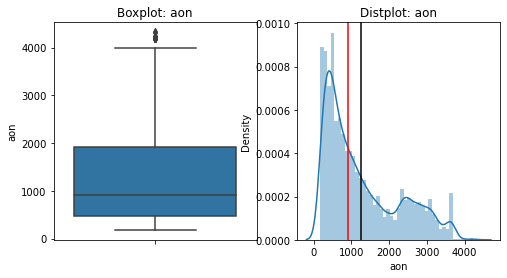

Skewness 0.8991075236335778
Kurtosis -0.3813088103396396
----------------------------------------------------------------------


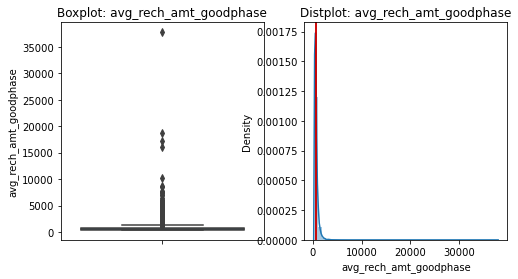

Skewness 21.2247909742358
Kurtosis 1263.8279405416217
----------------------------------------------------------------------


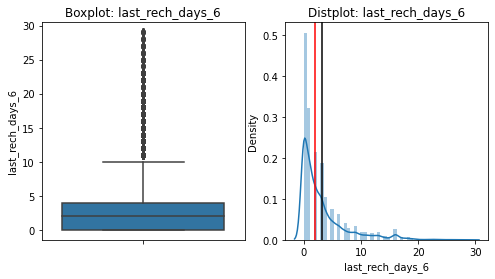

Skewness 2.1681316716535526
Kurtosis 5.349868632453306
----------------------------------------------------------------------


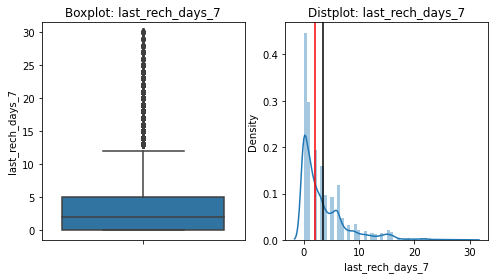

Skewness 2.0684064524030434
Kurtosis 5.196485074997338
----------------------------------------------------------------------


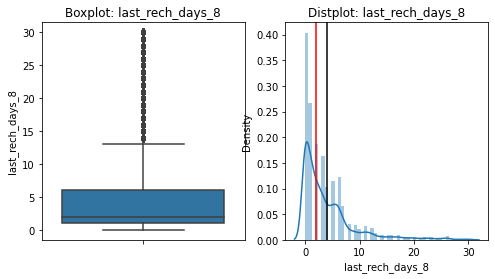

Skewness 2.2380934830487496
Kurtosis 5.863358979005317
----------------------------------------------------------------------


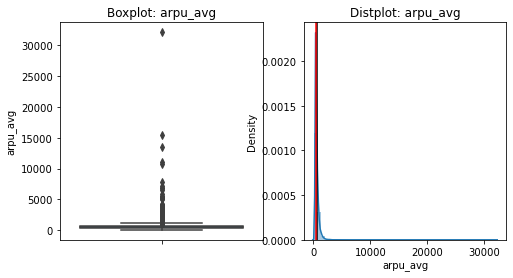

Skewness 21.575552389594638
Kurtosis 1333.099610113571
----------------------------------------------------------------------


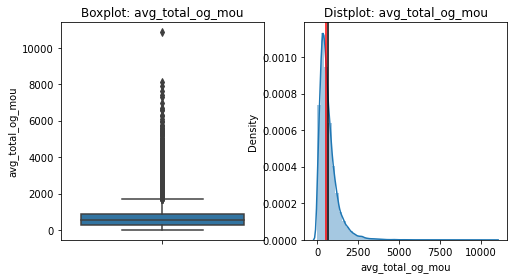

Skewness 2.820494503123597
Kurtosis 16.669571475210915
----------------------------------------------------------------------


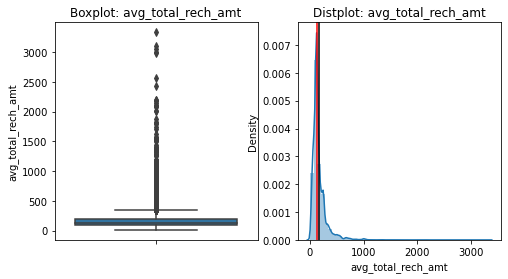

Skewness 5.060054854111723
Kurtosis 54.16768269427905
----------------------------------------------------------------------


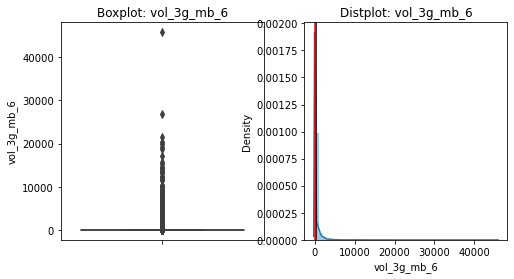

Skewness 12.401095231862525
Kurtosis 373.02380319960577
----------------------------------------------------------------------


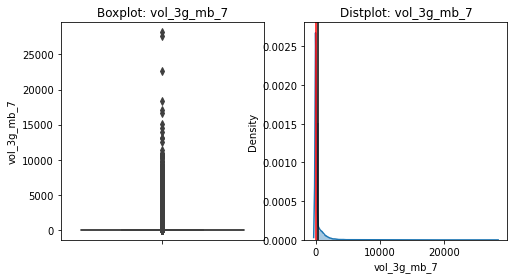

Skewness 8.298934775425039
Kurtosis 141.8791553802137
----------------------------------------------------------------------


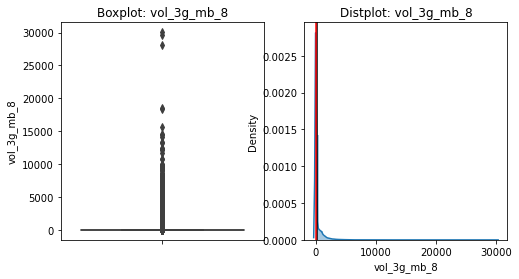

Skewness 9.284871605916722
Kurtosis 185.2087236601435
----------------------------------------------------------------------


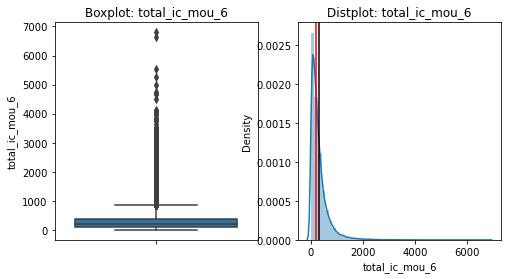

Skewness 3.7877421215561085
Kurtosis 27.538588238151853
----------------------------------------------------------------------


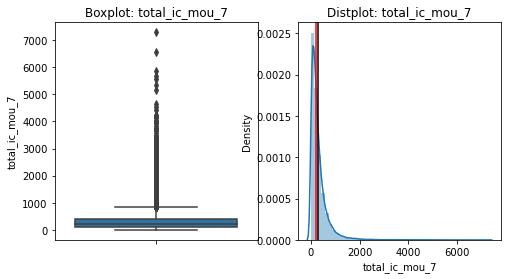

Skewness 4.0235595690522725
Kurtosis 30.795149613995353
----------------------------------------------------------------------


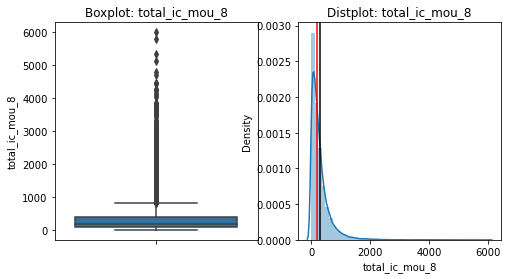

Skewness 3.758617695773227
Kurtosis 25.791487366163057
----------------------------------------------------------------------


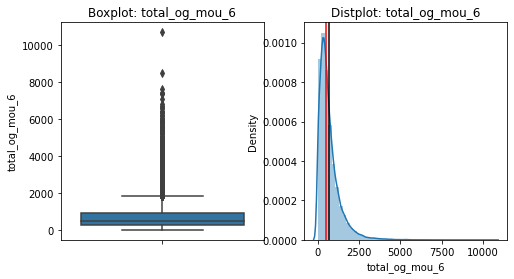

Skewness 2.6669430064117097
Kurtosis 13.213523429094835
----------------------------------------------------------------------


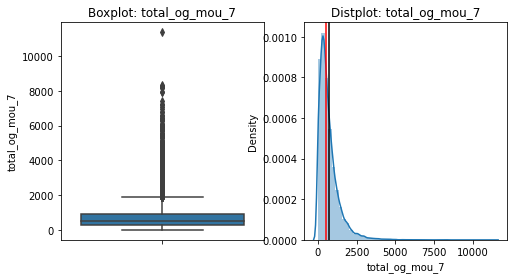

Skewness 2.7898687305247516
Kurtosis 14.8327790913699
----------------------------------------------------------------------


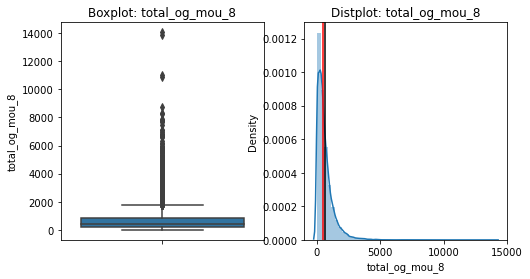

Skewness 3.32163288381229
Kurtosis 25.349407742279574
----------------------------------------------------------------------


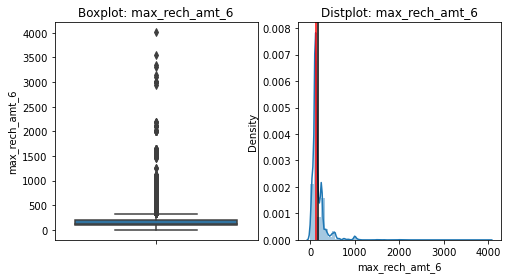

Skewness 5.63944206902262
Kurtosis 60.745885373225754
----------------------------------------------------------------------


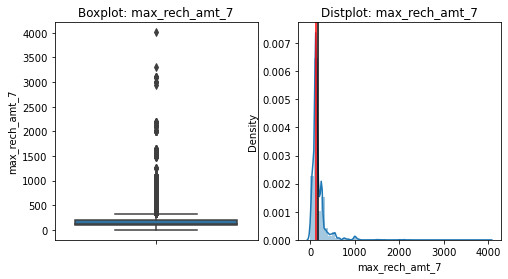

Skewness 5.4483341603388284
Kurtosis 53.66579727839285
----------------------------------------------------------------------


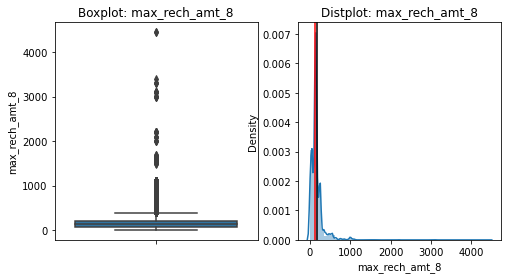

Skewness 6.30031834681481
Kurtosis 84.93242938560532
----------------------------------------------------------------------


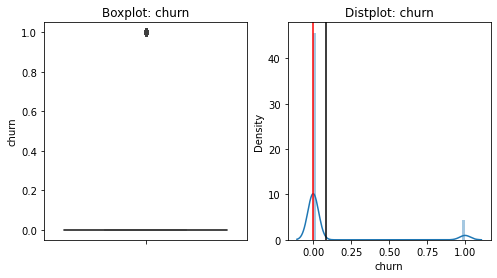

Skewness 2.9443661780487176
Kurtosis 6.669736672130084
----------------------------------------------------------------------


In [76]:
# Check the distribution of all columns
for cols in data_EDA.columns :
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    plt.title(f'Boxplot: {cols}')
    sns.boxplot(y=cols,data=data_EDA)
    plt.subplot(1,2,2)
    plt.title(f'Distplot: {cols}')
    sns.distplot(data_EDA[cols])
    plt.axvline(data_EDA[cols].mean(), c="black")
    plt.axvline(data_EDA[cols].median(), c="red")
    plt.show()
    print("Skewness",data_EDA[cols].skew())
    print("Kurtosis",data_EDA[cols].kurt())
    print('-'*70)

- Most columns have outlier values
- They are having skewed distribution

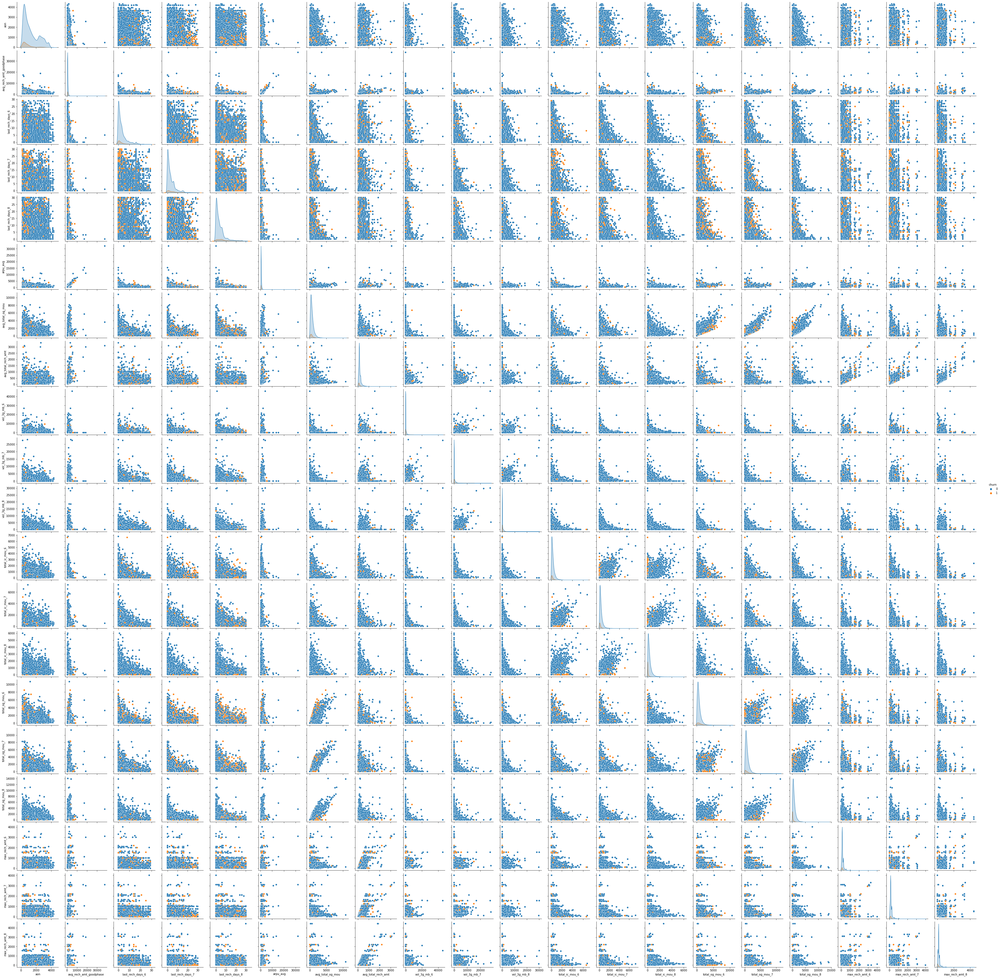

In [77]:
#Pairplot
sns.pairplot(data_EDA,hue='churn')
plt.show()

- For each of the above independent variables, clearly there is a considerable difference between the range of values for churn and non-churn customers. We can say that customers are more prone to churn if their values are below a certain values. For example in the case of max_rech_amt_8, based on the distribution we can say that, customers with max_rech_amt_8 of below 600 are more prone to churn than other customers.
- There exists linear and non-linear relationship between independent variables.
- There is multicollinearity

In [78]:
# Create 2 dataframes for churn and non-churn customers
data_churn = data_high_val[data_high_val['churn']==1]
data_nchurn = data_high_val[data_high_val['churn']==0]

In [79]:
data_churn.shape

(2593, 133)

In [80]:
data_nchurn.shape

(27418, 133)

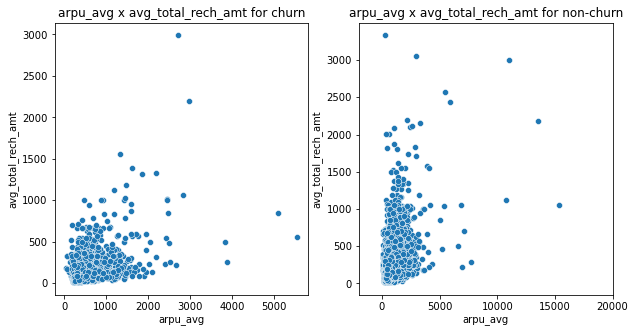

In [81]:
# Check the relation between arpu_avg,avg_total_rech_amt and churn
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
sns.scatterplot(x=data_churn['arpu_avg'],y=data_churn['avg_total_rech_amt'])
plt.title('arpu_avg x avg_total_rech_amt for churn')
plt.subplot(1,2,2)
sns.scatterplot(x=data_nchurn['arpu_avg'],y=data_nchurn['avg_total_rech_amt'])
plt.xlim((-2000,20000))
plt.title('arpu_avg x avg_total_rech_amt for non-churn')

plt.show()

- avg_total_rech_amt is high for non- churn customers  compared to churn customers
- arpu_avg for non-churn customers have a double range of values than that of churn customers.
- arpu_avg and avg_total_rech_amt has a slight linear realtionship.

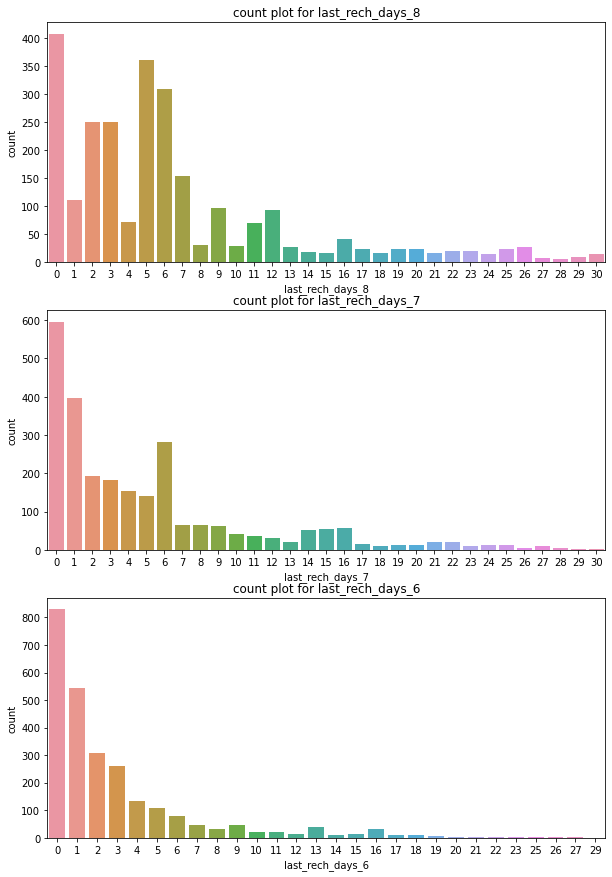

In [82]:
# Countplot of last recharge days of 6,7,8 months
# last_rech_days_8 x churn for churn customers
plt.figure(figsize=(10,15))
plt.subplot(3,1,1)
sns.countplot(data=data_churn,x='last_rech_days_8')
plt.title('count plot for last_rech_days_8')
plt.subplot(3,1,2)
sns.countplot(data=data_churn,x='last_rech_days_7')
plt.title('count plot for last_rech_days_7')
plt.subplot(3,1,3)
sns.countplot(data=data_churn,x='last_rech_days_6')
plt.title('count plot for last_rech_days_6')

plt.show()

- Interestingly customers who have churned has recharged on the last day of 8th month also. But compared to 6th and 7th month the number of customers who have recharged in last day of month 8 is almost half as that of 6th month
- Many churn customers have recharged 5 to 6 days before last day of the month in month of August
- Most customers have a tendency to recharge last day of the month

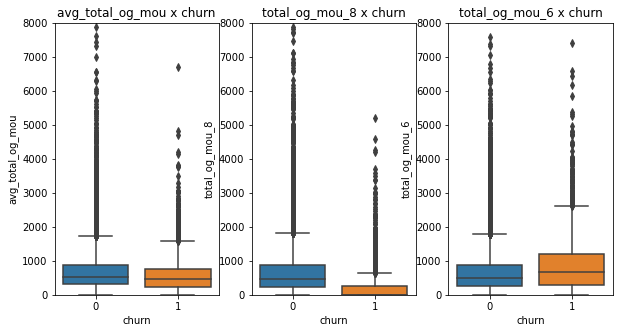

In [83]:
# Relation between outgoing minutes and churn
plt.figure(figsize=(10,5))
plt.subplot(1,3,1)
plt.title('avg_total_og_mou x churn')
sns.boxplot(data=data_EDA,y='avg_total_og_mou',x='churn')
plt.ylim((0,8000))


plt.subplot(1,3,2)
plt.title('total_og_mou_8 x churn')
sns.boxplot(data=data_EDA,y='total_og_mou_8',x='churn')
plt.ylim((0,8000))

plt.subplot(1,3,3)
plt.title('total_og_mou_6 x churn')
sns.boxplot(data=data_EDA,y='total_og_mou_6',x='churn')
plt.ylim((0,8000))
plt.show()

- Outgoing minutes are very less for chun customers in the 8th month compared to previous months and many have zero outgoing minutes


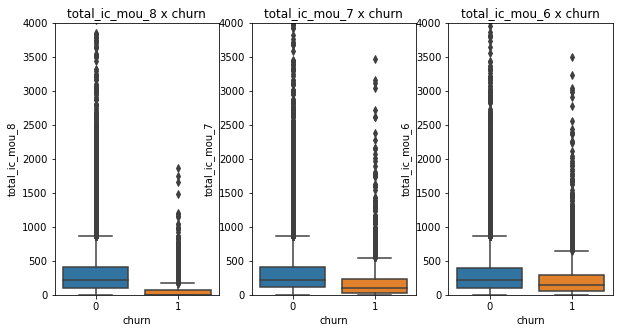

In [84]:
# Relation between incoming minutes and churn
plt.figure(figsize=(10,5))
plt.subplot(1,3,1)
plt.title('total_ic_mou_8 x churn')
sns.boxplot(data=data_EDA,y='total_ic_mou_8',x='churn')
plt.ylim((0,4000))


plt.subplot(1,3,2)
plt.title('total_ic_mou_7 x churn')
sns.boxplot(data=data_EDA,y='total_ic_mou_7',x='churn')
plt.ylim((0,4000))

plt.subplot(1,3,3)
plt.title('total_ic_mou_6 x churn')
sns.boxplot(data=data_EDA,y='total_ic_mou_6',x='churn')
plt.ylim((0,4000))
plt.show()

- Incoming minutes are very less for chun customers in the 8th month compared to previous months. Throughout 3 months churn customers had less incoming minutes than non-churn customers.

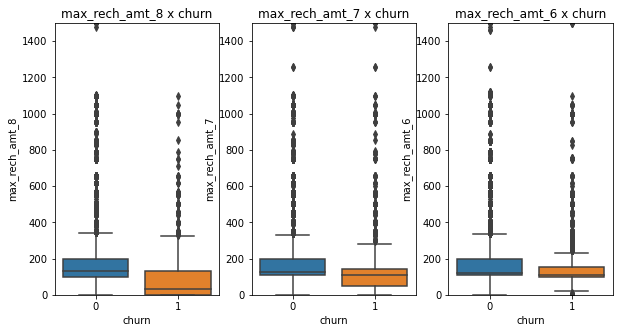

In [85]:
# Relation between max_rech_amt and churn
plt.figure(figsize=(10,5))
plt.subplot(1,3,1)
plt.title('max_rech_amt_8 x churn')
sns.boxplot(data=data_EDA,y='max_rech_amt_8',x='churn')
plt.ylim((0,1500))


plt.subplot(1,3,2)
plt.title('max_rech_amt_7 x churn')
sns.boxplot(data=data_EDA,y='max_rech_amt_7',x='churn')
plt.ylim((0,1500))

plt.subplot(1,3,3)
plt.title('max_rech_amt_6 x churn')
sns.boxplot(data=data_EDA,y='max_rech_amt_6',x='churn')
plt.ylim((0,1500))
plt.show()

- In the 8th month which is the action phase, churn cutomers have rechared for amount between 0 and 100. Throughout 3 months, churn customers have rechared for less amount compared to non-churn customers.
- If we ignore outliers Maximum recharge amount for churn customers is less than 150. 

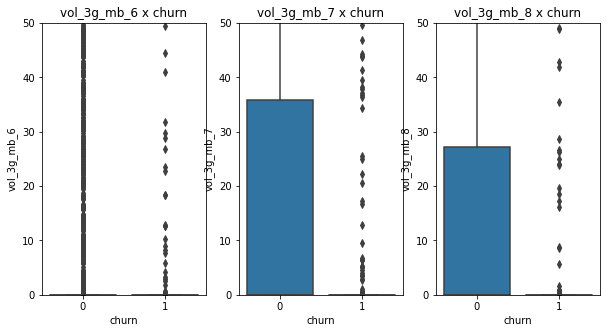

In [86]:
# Relation between vol_3g_mb and churn
plt.figure(figsize=(10,5))
plt.subplot(1,3,1)
plt.title('vol_3g_mb_6 x churn')
sns.boxplot(data=data_EDA,y='vol_3g_mb_6',x='churn')
plt.ylim((0,50))


plt.subplot(1,3,2)
plt.title('vol_3g_mb_7 x churn')
sns.boxplot(data=data_EDA,y='vol_3g_mb_7',x='churn')
plt.ylim((0,50))

plt.subplot(1,3,3)
plt.title('vol_3g_mb_8 x churn')
sns.boxplot(data=data_EDA,y='vol_3g_mb_8',x='churn')
plt.ylim((0,50))
plt.show()

- Most of the Churn customers have not used 3g data
- There are a lot of outliers in these variables.

In [87]:
# Check the correlation between variables
data_cor = data_EDA.corr()
data_cor

,aon,avg_rech_amt_goodphase,last_rech_days_6,last_rech_days_7,last_rech_days_8,arpu_avg,avg_total_og_mou,avg_total_rech_amt,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,churn
aon,1.000000,-0.008322,0.137492,0.068091,0.082711,0.004286,-0.097310,0.185518,-0.005321,-0.005486,0.002545,0.143746,0.138516,0.155290,-0.092137,-0.106591,-0.054617,0.158491,0.145869,0.158414,-0.124502
avg_rech_amt_goodphase,-0.008322,1.000000,-0.088116,-0.081325,-0.062497,0.947808,0.445276,0.423869,0.181035,0.196685,0.172528,0.141429,0.152961,0.133678,0.415943,0.415832,0.327188,0.338338,0.374240,0.342930,0.016692
last_rech_days_6,0.137492,-0.088116,1.000000,0.224429,0.196130,-0.085485,-0.184528,0.304573,0.065465,0.077497,0.070583,-0.035078,-0.025194,0.000584,-0.205177,-0.171930,-0.104408,0.272610,0.275198,0.209948,-0.018277
last_rech_days_7,0.068091,-0.081325,0.224429,1.000000,0.240238,-0.111721,-0.187368,0.240639,0.052865,0.021874,0.018266,0.020968,-0.043195,-0.063523,-0.056145,-0.204117,-0.223016,0.241821,0.204728,0.152481,0.117938
last_rech_days_8,0.082711,-0.062497,0.196130,0.240238,1.000000,-0.116890,-0.176152,0.194259,0.042663,0.040704,0.012506,0.015118,-0.007502,-0.051790,-0.090850,-0.138698,-0.226152,0.190561,0.167777,0.125164,0.150809
arpu_avg,0.004286,0.947808,-0.085485,-0.111721,-0.116890,1.000000,0.466131,0.416566,0.179719,0.201148,0.215779,0.142005,0.171269,0.184950,0.363894,0.418030,0.428625,0.300541,0.337369,0.401376,-0.060050
avg_total_og_mou,-0.097310,0.445276,-0.184528,-0.187368,-0.176152,0.466131,1.000000,0.012620,-0.126962,-0.130065,-0.108869,0.055265,0.088886,0.096555,0.816345,0.920815,0.861220,-0.016651,-0.004411,0.053618,-0.043437
avg_total_rech_amt,0.185518,0.423869,0.304573,0.240639,0.194259,0.416566,0.012620,1.000000,0.245476,0.259466,0.259672,0.117781,0.138988,0.151962,-0.018523,0.001399,0.048825,0.824614,0.820644,0.847820,-0.071800
vol_3g_mb_6,-0.005321,0.181035,0.065465,0.052865,0.042663,0.179719,-0.126962,0.245476,1.000000,0.705202,0.662942,0.011948,0.008899,0.012958,-0.112021,-0.124224,-0.093974,0.236373,0.186566,0.189410,-0.024852
vol_3g_mb_7,-0.005486,0.196685,0.077497,0.021874,0.040704,0.201148,-0.130065,0.259466,0.705202,1.000000,0.743948,0.004140,0.018858,0.024464,-0.125458,-0.123885,-0.089340,0.188465,0.246764,0.210196,-0.043264


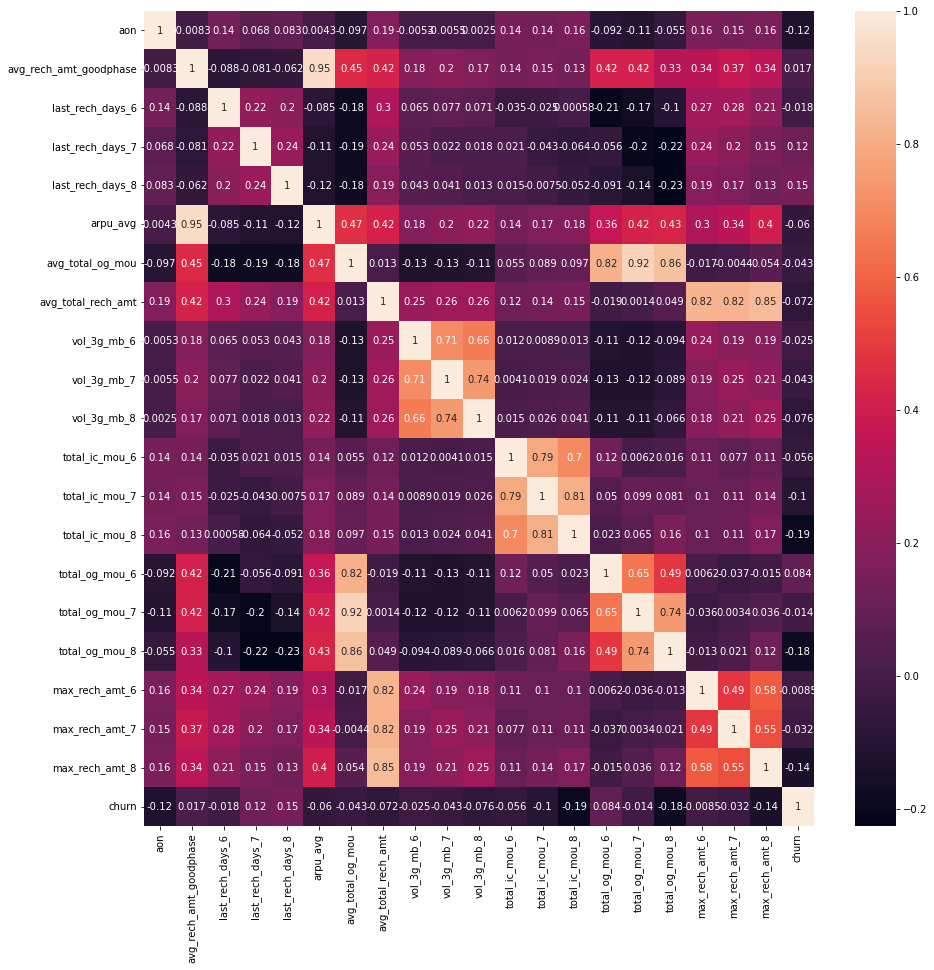

In [141]:
plt.figure(figsize=(15,15))
sns.heatmap(data_cor,annot=True)
plt.show()

- High multicollinearity exists between independent variables.
- avg_rech_amt_goodphase has high positive correlation with arpu_avg

## 2: Data preparation

### 2.1 Outlier treatment

From the EDA it is clear that lot of variables in the data has outlier values. These oulier values are problematic 
in case of linear models. Also in the telecom data, extreme values in the variables are very rare to happen.
Here we are handling outliers using capping method as we have large number of variables.


In [88]:
data_high_val_cols = data_high_val.columns

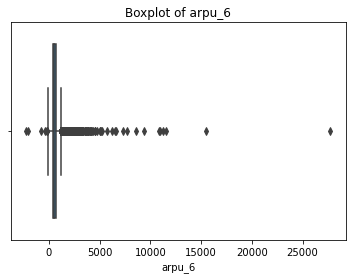

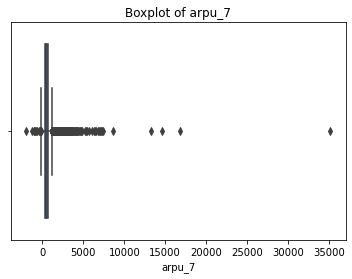

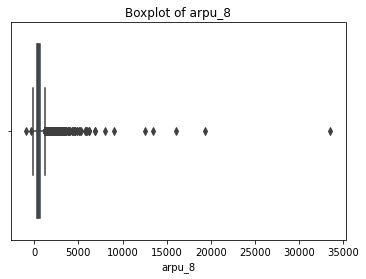

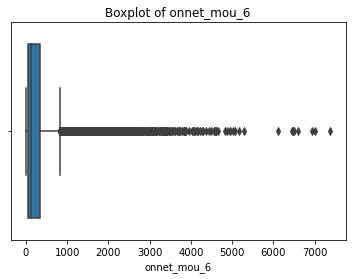

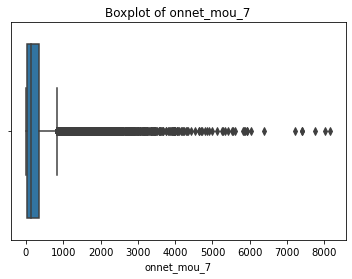

...

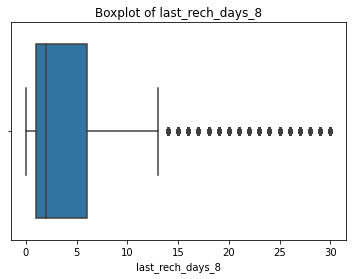

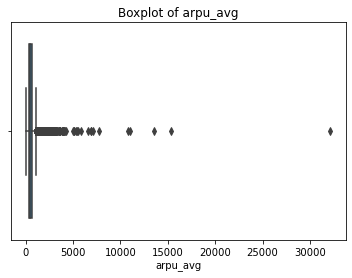

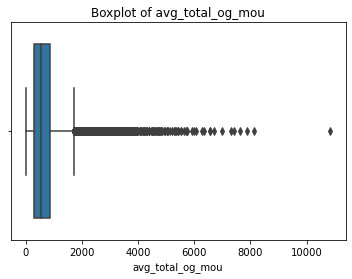

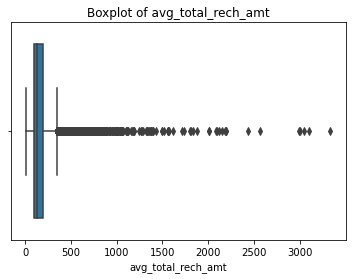

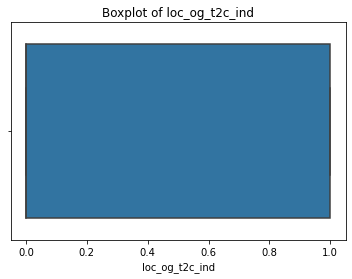

In [89]:
# Check the outlier values
for col in data_high_val_cols:
    plt.title(f'Boxplot of {col}')
    sns.boxplot(data_high_val[col])
    plt.show()

In [90]:
#Drop og_others_7,og_others_8 as they have only zero as value
data_high_val.drop(labels=['og_others_7','og_others_8'],axis=1,inplace=True)

In [91]:
data_high_val.shape

(30011, 131)

In [92]:
# create a list with required columns to handle outliers
data_high_val_cols = data_high_val.columns
data_high_val_cols = list(set(data_high_val_cols) - set(['loc_og_t2c_ind','churn','sachet_2g_6','sachet_2g_7',
                                                         'sachet_2g_8','sachet_3g_6','sachet_3g_7','sachet_3g_8',
                                                         'last_rech_days_6','last_rech_days_7','last_rech_days_8',
                                                         'arpu_6','arpu_7','arpu_8','monthly_2g_6','monthly_2g_7',
                                                         'monthly_2g_8','monthly_3g_6','monthly_3g_7','monthly_3g_8',
                                                        ]))


In [93]:
temp=data_high_val.copy()

- As variables are having right skewed distribution we will cap the upper limit to 1.5*IQR. As 0 is a meaningful value in case of the telecom variables, we are not capping the lower values.


In [94]:

for col in data_high_val_cols:
    IQR = (data_high_val[col].quantile([.75]).values[0] - data_high_val[col].quantile([.25]).values[0])
    upper_limit = data_high_val[col].quantile([.75]).values[0] + 1.5*IQR
    data_high_val[col] = np.where(data_high_val[col]>upper_limit,upper_limit,data_high_val[col])
    


In [95]:
# HANDLE outlier for arpu columns by applying limit at both ends as they have negative values also
for col in ['arpu_6','arpu_7','arpu_8']:
    IQR = (data_high_val[col].quantile([.75]).values[0] - data_high_val[col].quantile([.25]).values[0])
    upper_limit =  data_high_val[col].quantile([.75]).values[0] + 1.5*IQR
    lower_limit =  data_high_val[col].quantile([.25]).values[0] - 1.5*IQR
    data_high_val[col] = np.where(data_high_val[col]>upper_limit,upper_limit,data_high_val[col])
    data_high_val[col] = np.where(data_high_val[col]<upper_limit,lower_limit,data_high_val[col])

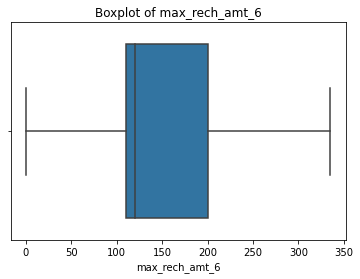

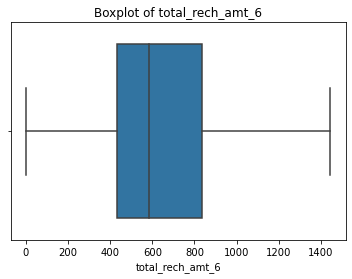

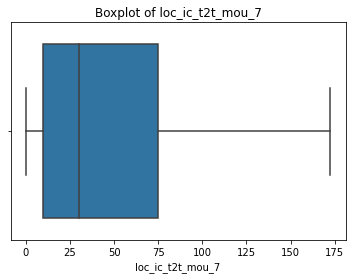

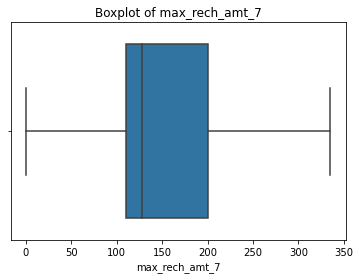

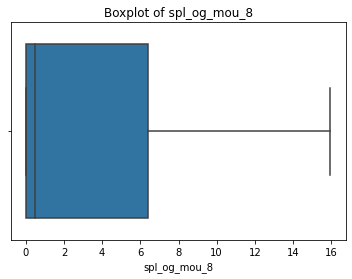

...

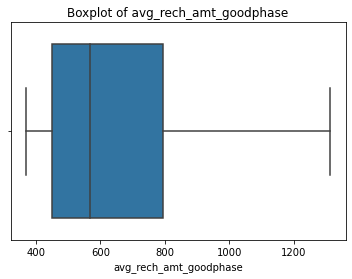

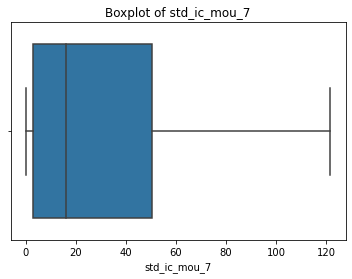

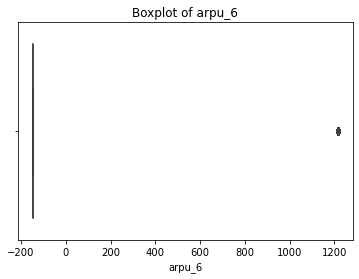

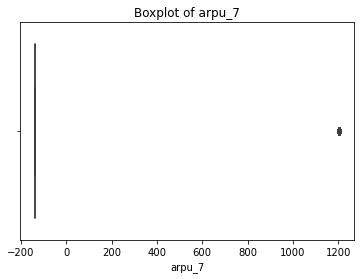

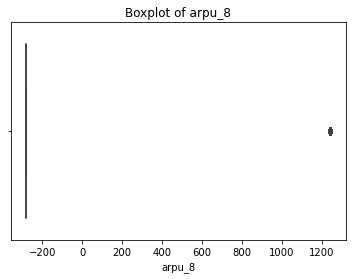

In [96]:
# Plot boxplot for again for the outlier handled columns
for col in data_high_val_cols + ['arpu_6','arpu_7','arpu_8']:
    plt.title(f'Boxplot of {col}')
    sns.boxplot(data_high_val[col])
    plt.show()

In [97]:
data_high_val.describe()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_rech_amt_goodphase,churn,last_rech_days_6,last_rech_days_7,last_rech_days_8,arpu_avg,avg_total_og_mou,avg_total_rech_amt,loc_og_t2c_ind
count,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.0,30011.0,30011.000000,30011.000000,30011.000000,30011.0,30011.0,30011.0,30011.000000,30011.000000,30011.000000,30011.0,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.000000,30011.0,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.000000,30011.0,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000
mean,-72.119023,-61.245079,-203.369914,236.820455,242.57623,200.117975,371.556876,377.423956,330.952832,0.0,0.0,0.0,0.0,0.0,0.0,61.666420,61.977604,56.611641,159.981982,161.135644,147.621479,3.210185,3.332007,2.944141,0.0,0.061958,0.030956,251.021013,252.938691,231.134595,112.63768,120.748531,84.022959,136.237496,143.364541,106.681684,0.0,0.0,0.0,349.782283,370.664141,292.488127,0.0,0.0,0.0,3.186837,4.428531,3.941821,0.0,643.152318,663.896833,576.703562,49.944135,50.747314,47.307709,138.832407,140.074102,133.67

Outliers are removed now. But standard deviation for many columns have now become zero, Meaning they have only values as zero. So removing those columns with a constant value.

In [98]:
# Get columns with zero standard deviation
col_std0 = list(data_high_val.describe().T[data_high_val.describe().T['std']==0].index)

# Deleting those columns with std = 0
data_high_val.drop(labels=col_std0,axis=1,inplace=True)

In [99]:
data_high_val.describe()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,ic_others_6,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_7,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,avg_rech_amt_goodphase,churn,last_rech_days_6,last_rech_days_7,last_rech_days_8,arpu_avg,avg_total_og_mou,avg_total_rech_amt,loc_og_t2c_ind
count,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000
mean,-72.119023,-61.245079,-203.369914,236.820455,242.57623,200.117975,371.556876,377.423956,330.952832,61.666420,61.977604,56.611641,159.981982,161.135644,147.621479,3.210185,3.332007,2.944141,0.061958,0.030956,251.021013,252.938691,231.134595,112.63768,120.748531,84.022959,136.237496,143.364541,106.681684,349.782283,370.664141,292.488127,3.186837,4.428531,3.941821,643.152318,663.896833,576.703562,49.944135,50.747314,47.307709,138.832407,140.074102,133.677776,8.027229,8.455854,7.513318,217.002647,219.444848,207.141138,6.509310,6.953393,5.565429,18.130674,19.139893,16.522786,0.110023,0.157534,0.080294,31.692991,33.372531,28.728623,276.619389,281.524246,264.246989,0.037023,0.035917,11.468045,11.243911,9.547683,661.496635,658.600263,581.106261,149.103129,151.343407,147.117674,89.945920,92.172453,85.379528,8.911390,9.174096,5.902423,1.299577,0.124854,0.131352,0.114058,0.500383,0.587185,0.607611,0.173903,0.185132,0.173203,0.137916,0.150212,0.140415,1263.957882,0.999762,1.242550,661.251841,0.086402,3.173370,3.476858,4.009530,

In [100]:
data_high_val.shape

(30011, 107)

### 2.2 Train test split


In [101]:
# import model library

from sklearn.model_selection import train_test_split

In [102]:
# divide to X & y and divide data into Train and Test
X = data_high_val.drop('churn', axis=1)
y = data_high_val['churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=100,stratify=y)

In [103]:
X_train.shape

(21007, 106)

In [104]:
X_test.shape

(9004, 106)

In [105]:
print(y_train.mean())
print(y_test.mean())

0.08639977150473652
0.08640604175921812


### 2.2 Feature scaling


In [106]:
cols_to_scale =  list(set(X_train.columns) - set(['loc_og_t2c_ind']) )
cols_to_scale

['sachet_2g_8',
 'sachet_3g_6',
 'onnet_mou_7',
 'max_rech_amt_6',
 'total_rech_amt_6',
 'avg_total_og_mou',
 'loc_ic_t2t_mou_7',
 'max_rech_amt_7',
 'loc_og_t2t_mou_6',
 'last_rech_days_7',
 'spl_og_mou_8',
 'monthly_3g_7',
 'loc_ic_t2f_mou_6',
 'std_og_t2t_mou_7',
 'std_ic_t2m_mou_8',
 'sachet_3g_8',
 'spl_og_mou_7',
 'std_og_t2m_mou_7',
 'total_rech_amt_7',
 'total_og_mou_6',
 'arpu_6',
 'spl_og_mou_6',
 'total_og_mou_8',
 'std_ic_t2t_mou_7',
 'std_og_t2m_mou_6',
 'std_ic_t2f_mou_8',
 'loc_og_t2t_mou_8',
 'loc_og_mou_8',
 'ic_others_6',
 'offnet_mou_6',
 'last_day_rch_amt_8',
 'std_og_mou_6',
 'std_ic_mou_6',
 'jul_vbc_3g',
 'arpu_8',
 'loc_og_mou_6',
 'vol_2g_mb_7',
 'loc_og_t2f_mou_8',
 'monthly_2g_8',
 'loc_ic_t2f_mou_8',
 'loc_ic_t2t_mou_8',
 'offnet_mou_7',
 'total_rech_num_7',
 'total_rech_num_6',
 'last_rech_days_8',
 'std_og_mou_8',
 'loc_og_t2m_mou_8',
 'last_rech_days_6',
 'loc_og_t2f_mou_7',
 'vol_3g_mb_7',
 'aug_vbc_3g',
 'ic_others_8',
 'offnet_mou_8',
 'loc_ic_mou_6',


In [107]:
# Standardization
from sklearn.preprocessing import StandardScaler

In [108]:
scaler= StandardScaler()

X_train[cols_to_scale] = scaler.fit_transform(X_train[cols_to_scale])

X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,ic_others_6,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_7,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,avg_rech_amt_goodphase,last_rech_days_6,last_rech_days_7,last_rech_days_8,arpu_avg,avg_total_og_mou,avg_total_rech_amt,loc_og_t2c_ind
76985,-0.239767,-0.247659,-0.236867,0.816373,2.210895,1.838906,-0.552660,-0.690393,-0.538072,-0.371233,-0.787449,-0.799522,-0.404311,-0.810664,-0.925770,-0.687196,-0.692558,-0.683062,1.768939,1.752459,-0.485714,-0.872613,-0.937038,1.843614,2.040879,0.300518,-0.305076,-0.336035,-0.540137,0.332303,1.615301,-0.363492,2.100331,2.153968,0.804757,0.014978,1.099172,-0.814113,-0.767710,-0.911950,-0.897483,-0.852188,-0.765461,-0.908172,-0.727132,-0.735644,-0.730020,-0.900758,-0.887458,-0.966460,1.447921,2.094138,2.050371,-0.048880,2.187779,0.498066,1.800376,-0.584111,-0.579730,0.177489,2.236773,0.609031,-0.848281,-0.406463,-0.832253,-0.587122,-0.578890,-0.910584,-0.301757,-0.216037,-0.203091,-0.800542,0.559513,0.561515,-0.272354,0.818329,0.502531,0.437341,0.727602,-0.595718,-0.597502,1.256829,1.735498,2.352265,-0.336887,2.499145,-0.292936,0.215918,-0.329808,-0.30509,-0.297591,-0.298048,-0.163195,-0.156770,-0.145060,-1.101267,1.737834,-0.578298,-0.631984,0.885968,-0.567962,0.387655,-0.216370,0.104574,0.351555,1
77814,-0.239767,-0.247659,-0.236867,2.213025,2.210895,2.177819,-0.658406,-0.537573,-0.651376,1.835823,2.185958,1.827892,-0.626227,-0.399872,-0.617352,-0.547698,-0.665701,-0.683062,-0.577383,-0.577925,-0.016193,0.227511,-0.013762,2.033698,2.040879,1.982338,-0.163415,-0.202462,-0.183488,2.027498,1.820226,1.830162,-0.125941,0.448332,0.147691,1.707446,1.694750,1.324939,0.738041,1.031019,0.900380,-0.622130,-0.513448,-0.608857,-0.633925,-0.735644,-0.730020,-0.349955,-0.204362,-0.300650,0.214589,0.284963,2.050371,-0.587720,-0.762558,-0.707137,-0.577049,-0.584111,-0.579730,-0.493622,-0.581311,0.141847,-0.488359,-0.387916,-0.347505,-0.587122,-0.578890,1.081005,0.946064,0.914365,0.825880,0.819166,0.526425,-0.459375,-0.480581,-0.033502,0.262167,0.215657,-0.406317,-0.595718,-0.597502,-0.596217,-0.578101,-0.329636,-0.336887,-0.319622,-0.292936,-0.310948,-0.329808,-0.30509,-0.297591,-0.298048,-0.163195,-0.156770,-0.145060,-0.830942,-0.579109,-0.578298,1.017147,-0.282995,0.113950,-0.592990,0.934905,1.770256,-0.393448,0
24787,-0.239767,-0.247659,-0.236867,-0.225131,-0.328514,-0.354804,-0.391521,-0.433411,-0.507602,1.521974,1.309921,0.917730,0.461283,0.317000,0.122072,-0.427515,0.259837,-0.426790,1.768939,-0.018632,0.612281,0.470994,0.224686,-0.682871,-0.680234,-0.667225,-0.701539,-0.736601,-0.676305,-0.763342,-0.782244,-0.721610,-0.639364,2.153968,-0.551996,-0.451895,-0.522975,-0.559023,0.558928,2.242515,0.676468

In [109]:
# scale test data

X_test[cols_to_scale] = scaler.transform(X_test[cols_to_scale])

In [110]:
X_test.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,ic_others_6,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_7,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,avg_rech_amt_goodphase,last_rech_days_6,last_rech_days_7,last_rech_days_8,arpu_avg,avg_total_og_mou,avg_total_rech_amt,loc_og_t2c_ind
50179,-0.239767,-0.247659,-0.236867,1.220661,1.899266,-0.180630,-0.227988,-0.095693,-0.763088,-0.859056,-0.753704,-0.739321,-0.756931,-0.807876,-0.755065,-0.687196,-0.692558,-0.683062,-0.577383,1.752459,-0.852421,-0.861363,-0.808797,2.033698,2.040879,0.523542,0.592729,0.843675,-0.318846,1.018461,1.454981,-0.209833,2.100331,2.153968,1.870271,0.440977,0.869551,-0.621868,-0.879797,-0.792881,-0.802127,-0.957621,-0.994793,-0.955963,2.087183,-0.735644,-0.730020,-0.051720,-1.005858,-0.973285,-0.196881,2.094138,2.050371,-0.460398,-0.671731,-0.611758,1.800376,1.811672,-0.579730,-0.309796,1.226612,0.956940,-0.201707,-0.676910,-0.760488,1.777615,1.803919,0.085210,-0.856344,-0.922538,-0.053095,-0.413220,-1.021073,-0.343365,-0.364899,-0.173804,-0.539045,0.338815,-0.406317,-0.595718,-0.597502,-0.596217,-0.578101,-0.329636,-0.336887,-0.319622,-0.292936,-0.310948,-0.329808,-0.30509,-0.297591,-0.298048,-0.163195,-0.15677,-0.14506,-0.477676,-0.579109,-0.578298,-0.296630,-0.750580,0.795861,0.387655,-0.792671,0.247472,-0.370045,1
20587,-0.239767,-0.247659,-0.236867,0.425619,0.258017,-0.122370,0.090940,0.312493,0.262723,2.233046,2.228357,1.577814,1.277298,1.850870,1.560333,0.147647,2.024142,-0.371380,-0.577383,-0.577925,1.630278,1.906431,1.347754,-0.299438,-0.342463,-0.585197,-0.600111,-0.731555,-0.619174,-0.582606,-0.653690,-0.669394,-0.270476,-0.012520,0.889998,0.229301,0.244641,0.028686,2.290449,2.286018,1.198416,0.608352,1.102872,1.017835,-0.189607,-0.193149,-0.520728,1.312384,1.523378,0.865559,0.771474,-0.383290,0.147056,0.319617,-0.601864,0.255451,-0.577049,-0.584111,1.762587,0.197383,-0.648318,0.082918,1.023108,1.051891,0.614439,-0.587122,1.803919,1.507774,1.362005,1.055665,0.198898,0.147222,0.269357,-0.459375,-0.364899,-0.173804,-0.806116,0.338815,0.500818,-0.595718,-0.597502,-0.596217,-0.578101,-0.329636,-0.336887,-0.319622,-0.292936,-0.310948,-0.329808,-0.30509,-0.297591,-0.298048,-0.163195,-0.15677,-0.14506,-0.174584,-0.579109,-0.578298,0.210086,-0.750580,0.113950,-0.592990,0.176431,0.172784,-0.409050,0
51116,-0.239767,-0.247659,-0.236867,-0.090482,0.894504,0.885450,1.277085,1.065458,0.568722,2.174669,2.228357,2.225128,2.410826,2.396130,2.026629,0.956735,0.342474,-0.334440,1.768939,-0.577925,2.265168,2.441303,2.431290,-0.682871,-0.669940,-0.638260,-0.017594,-0.350093,-0.462992,-0.484073,-0.618560,-0.632499,2.100331,0.261413,-0.507600,0.688648,1.048246,0.659148,2.290449,2.286018,2.285742,1.369834,0.104366

## 3: Model for interpretation

Let's build a logistic regression model to get most important variables that can describe telecom churn.

In [111]:
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,ic_others_6,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_7,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,avg_rech_amt_goodphase,last_rech_days_6,last_rech_days_7,last_rech_days_8,arpu_avg,avg_total_og_mou,avg_total_rech_amt,loc_og_t2c_ind
76985,-0.239767,-0.247659,-0.236867,0.816373,2.210895,1.838906,-0.552660,-0.690393,-0.538072,-0.371233,-0.787449,-0.799522,-0.404311,-0.810664,-0.925770,-0.687196,-0.692558,-0.683062,1.768939,1.752459,-0.485714,-0.872613,-0.937038,1.843614,2.040879,0.300518,-0.305076,-0.336035,-0.540137,0.332303,1.615301,-0.363492,2.100331,2.153968,0.804757,0.014978,1.099172,-0.814113,-0.767710,-0.911950,-0.897483,-0.852188,-0.765461,-0.908172,-0.727132,-0.735644,-0.730020,-0.900758,-0.887458,-0.966460,1.447921,2.094138,2.050371,-0.048880,2.187779,0.498066,1.800376,-0.584111,-0.579730,0.177489,2.236773,0.609031,-0.848281,-0.406463,-0.832253,-0.587122,-0.578890,-0.910584,-0.301757,-0.216037,-0.203091,-0.800542,0.559513,0.561515,-0.272354,0.818329,0.502531,0.437341,0.727602,-0.595718,-0.597502,1.256829,1.735498,2.352265,-0.336887,2.499145,-0.292936,0.215918,-0.329808,-0.30509,-0.297591,-0.298048,-0.163195,-0.156770,-0.145060,-1.101267,1.737834,-0.578298,-0.631984,0.885968,-0.567962,0.387655,-0.216370,0.104574,0.351555,1
77814,-0.239767,-0.247659,-0.236867,2.213025,2.210895,2.177819,-0.658406,-0.537573,-0.651376,1.835823,2.185958,1.827892,-0.626227,-0.399872,-0.617352,-0.547698,-0.665701,-0.683062,-0.577383,-0.577925,-0.016193,0.227511,-0.013762,2.033698,2.040879,1.982338,-0.163415,-0.202462,-0.183488,2.027498,1.820226,1.830162,-0.125941,0.448332,0.147691,1.707446,1.694750,1.324939,0.738041,1.031019,0.900380,-0.622130,-0.513448,-0.608857,-0.633925,-0.735644,-0.730020,-0.349955,-0.204362,-0.300650,0.214589,0.284963,2.050371,-0.587720,-0.762558,-0.707137,-0.577049,-0.584111,-0.579730,-0.493622,-0.581311,0.141847,-0.488359,-0.387916,-0.347505,-0.587122,-0.578890,1.081005,0.946064,0.914365,0.825880,0.819166,0.526425,-0.459375,-0.480581,-0.033502,0.262167,0.215657,-0.406317,-0.595718,-0.597502,-0.596217,-0.578101,-0.329636,-0.336887,-0.319622,-0.292936,-0.310948,-0.329808,-0.30509,-0.297591,-0.298048,-0.163195,-0.156770,-0.145060,-0.830942,-0.579109,-0.578298,1.017147,-0.282995,0.113950,-0.592990,0.934905,1.770256,-0.393448,0
24787,-0.239767,-0.247659,-0.236867,-0.225131,-0.328514,-0.354804,-0.391521,-0.433411,-0.507602,1.521974,1.309921,0.917730,0.461283,0.317000,0.122072,-0.427515,0.259837,-0.426790,1.768939,-0.018632,0.612281,0.470994,0.224686,-0.682871,-0.680234,-0.667225,-0.701539,-0.736601,-0.676305,-0.763342,-0.782244,-0.721610,-0.639364,2.153968,-0.551996,-0.451895,-0.522975,-0.559023,0.558928,2.242515,0.676468

In [112]:
# import sklearn library
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(class_weight='balanced') # to handle class imbalance)

# importig RFE
from sklearn.feature_selection import RFE
# Select only 15 most important columns as per RFE
rfe = RFE(logreg,n_features_to_select=15)


In [113]:
rfe = rfe.fit(X_train, y_train)

list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('arpu_6', False, 87),
 ('arpu_7', False, 35),
 ('arpu_8', False, 67),
 ('onnet_mou_6', False, 33),
 ('onnet_mou_7', False, 18),
 ('onnet_mou_8', False, 32),
 ('offnet_mou_6', False, 64),
 ('offnet_mou_7', False, 14),
 ('offnet_mou_8', False, 8),
 ('loc_og_t2t_mou_6', False, 81),
 ('loc_og_t2t_mou_7', False, 71),
 ('loc_og_t2t_mou_8', False, 24),
 ('loc_og_t2m_mou_6', False, 45),
 ('loc_og_t2m_mou_7', False, 15),
 ('loc_og_t2m_mou_8', False, 41),
 ('loc_og_t2f_mou_6', False, 66),
 ('loc_og_t2f_mou_7', False, 79),
 ('loc_og_t2f_mou_8', False, 25),
 ('loc_og_t2c_mou_7', False, 82),
 ('loc_og_t2c_mou_8', False, 43),
 ('loc_og_mou_6', False, 75),
 ('loc_og_mou_7', False, 17),
 ('loc_og_mou_8', True, 1),
 ('std_og_t2t_mou_6', False, 34),
 ('std_og_t2t_mou_7', False, 16),
 ('std_og_t2t_mou_8', False, 9),
 ('std_og_t2m_mou_6', False, 65),
 ('std_og_t2m_mou_7', False, 68),
 ('std_og_t2m_mou_8', False, 69),
 ('std_og_mou_6', False, 23),
 ('std_og_mou_7', False, 40),
 ('std_og_mou_8', False, 84

In [114]:
# Put all the columns selected by RFE in the variable 'rfe_col'

rfe_col = X_train.columns[rfe.support_]

#Create a new train dataframe with selected columns for logistic regression
X_train_logreg = X_train[rfe_col]

X_train_logreg.head()

,loc_og_mou_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_7,loc_ic_mou_8,total_ic_mou_8,total_rech_num_8,last_day_rch_amt_8,vol_2g_mb_8,monthly_2g_8,monthly_3g_8,avg_rech_amt_goodphase,last_rech_days_8
76985,-0.937038,-0.814113,-0.897483,-0.908172,-0.730020,-0.887458,-0.966460,-0.832253,-0.216037,0.727602,1.256829,2.499145,-0.298048,-0.631984,0.387655
77814,-0.013762,1.324939,0.900380,-0.608857,-0.730020,-0.204362,-0.300650,-0.347505,0.914365,-0.406317,-0.596217,-0.319622,-0.298048,1.017147,-0.592990
24787,0.224686,-0.559023,0.676468,1.110614,-0.009124,1.142880,0.817883,0.591366,-0.922538,1.861520,-0.596217,-0.319622,-0.298048,-0.412714,0.387655
60192,-0.964130,-1.136213,-0.904239,-1.003450,-0.730020,-1.096757,-1.031350,-1.095823,2.327367,-0.508369,1.832434,-0.319622,-0.298048,0.414615,-0.789119
69896,0.659461,-0.056186,-0.397926,-0.058396,-0.730020,-0.504860,-0.273449,1.708940,-0.639937,0.500818,-0.596217,-0.319622,-0.298048,-1.017089,-0.789119


In [115]:
# import libraries statsmodel
# Assess model using statsmodels library
import statsmodels.api as sm

# LogisticRegression Model
X_train_sm = sm.add_constant(X_train_logreg)
logm1 = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())
mod1 = logm1.fit()
mod1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                21007
Model:                            GLM   Df Residuals:                    20991
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3924.6
Date:                Wed, 04 May 2022   Deviance:                       7849.3
Time:                        13:43:47   Pearson chi2:                 6.71e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.1931
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -4.0493      0.068    -59.260      0.000      -4.183      -3.915
loc_og_mou_8              -0.3834      0.082     -4.667      0.000      -0.544      -0.222
total_og_mou_8            -0.4477      0.051     -8.812      0.000      -0.547      -0.348
loc_ic_t2t_mou_8          -0.7053      0.104     -6.770      0.000      -0.910      -0.501
loc_ic_t2m_mou_8          -1.4321      0.153     -9.338      0.000      -1.733      -1.131
loc_ic_t2f_mou_8          -0.4559      0.063     -7.272      0.000      -0.579      -0.333
loc_ic_mou_7               0.4136      0.058      7.105      0.000       0.299       0.528
loc_ic_mou_8               0.9822      0.235      4.178      0.000       0.521       1.443
total_ic_mou_8            -0.5621      0.132     -4.269      0.000      -0.820      -0.304
total_rech_num_8          -0.3672      0.046     -7.994      0.000      -0.457      -0.277
last_day_rch_amt_8        -0.6968      0.046    -15.077      0.000      -0.787      -0.606
vol_2g_mb_8               -0.4172      0.056     -7.429      0.000      -0.527      -0.307
monthly_2g_8              -0.3497      0.077     -4.524      0.000      -0.501      -0.198
monthly_3g_8              -0.4428      0.081     -5.493      0.000      -0.601      -0.285
avg_rech_amt_goodphase     0.4495      0.033     13.731      0.000       0.385       0.514
last_rech_days_8           0.2735      0.026     10.583      0.000       0.223       0.324
==========================================================================================
"""

In [116]:
#As per the logreg model none variables have a p-value greater than 0.05. Let's also look at the VIFs.

# import library variance_inflation_factor
from statsmodels.stats.outliers_influence import variance_inflation_factor


# Make a VIF dataframe for all the variables present
# Check for the VIF values of the feature variables.

vif = pd.DataFrame()
vif['Features'] = X_train_logreg.columns
vif['VIF'] = [variance_inflation_factor(X_train_logreg.values, i) for i in range(X_train_logreg.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,loc_ic_mou_8,24.97
3,loc_ic_t2m_mou_8,10.06
7,total_ic_mou_8,6.39
5,loc_ic_mou_7,3.91
2,loc_ic_t2t_mou_8,3.61
0,loc_og_mou_8,2.35
1,total_og_mou_8,1.94
8,total_rech_num_8,1.65
10,vol_2g_mb_8,1.54
4,loc_ic_t2f_mou_8,1.48


In [117]:
# Dropping 'loc_ic_mou_8' as vif is >5
X_train_logreg.drop('loc_ic_mou_8',axis=1,inplace=True)
X_train_sm.drop('loc_ic_mou_8',axis=1,inplace=True)

In [118]:
logm2= sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
mod2 = logm2.fit()
mod2.summary()
              

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                21007
Model:                            GLM   Df Residuals:                    20992
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3932.3
Date:                Wed, 04 May 2022   Deviance:                       7864.5
Time:                        13:43:54   Pearson chi2:                 9.13e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.1926
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -4.0596      0.069    -58.891      0.000      -4.195      -3.924
loc_og_mou_8              -0.3814      0.083     -4.585      0.000      -0.544      -0.218
total_og_mou_8            -0.4614      0.051     -9.064      0.000      -0.561      -0.362
loc_ic_t2t_mou_8          -0.4237      0.079     -5.362      0.000      -0.579      -0.269
loc_ic_t2m_mou_8          -0.9444      0.120     -7.901      0.000      -1.179      -0.710
loc_ic_t2f_mou_8          -0.3930      0.062     -6.372      0.000      -0.514      -0.272
loc_ic_mou_7               0.4498      0.058      7.785      0.000       0.337       0.563
total_ic_mou_8            -0.3610      0.109     -3.322      0.001      -0.574      -0.148
total_rech_num_8          -0.3703      0.046     -8.052      0.000      -0.460      -0.280
last_day_rch_amt_8        -0.7001      0.046    -15.167      0.000      -0.791      -0.610
vol_2g_mb_8               -0.4158      0.056     -7.404      0.000      -0.526      -0.306
monthly_2g_8              -0.3520      0.077     -4.557      0.000      -0.503      -0.201
monthly_3g_8              -0.4425      0.081     -5.489      0.000      -0.601      -0.285
avg_rech_amt_goodphase     0.4460      0.033     13.644      0.000       0.382       0.510
last_rech_days_8           0.2703      0.026     10.484      0.000       0.220       0.321
==========================================================================================
"""

In [119]:
#p values are less than 0.05 Check vif again
# Make a VIF dataframe for all the variables present

vif = pd.DataFrame()
vif['Features'] = X_train_logreg.columns
vif['VIF'] = [variance_inflation_factor(X_train_logreg.values, i) for i in range(X_train_logreg.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,total_ic_mou_8,4.97
3,loc_ic_t2m_mou_8,4.61
5,loc_ic_mou_7,3.51
0,loc_og_mou_8,2.34
2,loc_ic_t2t_mou_8,2.30
1,total_og_mou_8,1.93
7,total_rech_num_8,1.65
9,vol_2g_mb_8,1.54
4,loc_ic_t2f_mou_8,1.41
8,last_day_rch_amt_8,1.33


Now all selected columns have a p value less than 0.05 and a vif value of less than 5.

In [120]:
len(X_train_logreg.columns)

14

In [121]:
# Get list of important columns in predicting whether a customer will churn or not.
logreg = LogisticRegression(class_weight='balanced') # to handle class imbalance
mod3 = logreg.fit(X_train_logreg,y_train)


In [122]:
imp_df = pd.DataFrame({
    "Varname": list(X_train_logreg.columns),
    "Coefficients": np.round((mod3.coef_)[0],3)
})

In [123]:
imp_df['coef_mag'] = np.abs(imp_df['Coefficients'])
imp_df.sort_values(by="coef_mag", ascending=False,inplace=True)


In [124]:
imp_df.reset_index(drop=True,inplace=True)
imp_df

,Varname,Coefficients,coef_mag
0,last_day_rch_amt_8,-0.745,0.745
1,loc_ic_t2m_mou_8,-0.677,0.677
2,avg_rech_amt_goodphase,0.602,0.602
3,last_rech_days_8,0.488,0.488
4,loc_og_mou_8,-0.466,0.466
5,loc_ic_mou_7,0.441,0.441
6,total_og_mou_8,-0.427,0.427
7,loc_ic_t2f_mou_8,-0.387,0.387
8,monthly_3g_8,-0.384,0.384
9,loc_ic_t2t_mou_8,-0.381,0.381


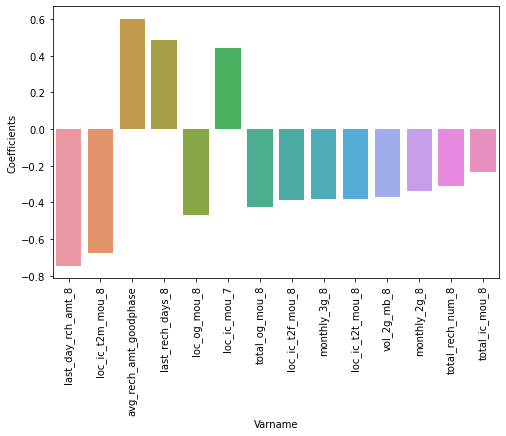

In [125]:
plt.figure(figsize=(8,5))
sns.barplot(x=imp_df.Varname,y=imp_df.Coefficients)
plt.xticks(rotation=90)
plt.show()

Important features:
- Churn customer behaviour is different to non-churn customers in the action phase as most of the indicator variables are from the 8th month.
- As per the model, amount recharged in last day of month 8(action phase) has a high influence in the classification of churn and non-churn customers. A decrease in the amount recharged by high value customers is an indication of customer churn. As most of the customers recharge in the last day of the month, if a high value customer is not recharging on last day of the month or if the customer has not recharged for few days before last day of the month can be indicators of churn.
- If the incoming and outgoing minutes of customers are decreasing then they are higly likely to churn so offer new plans and offers to those high value customers. Here loc_ic_t2m_mou_8 has high negative influence on churn.Here customer might be intereseted to plans provided by a different telecom operators. So the recommended plans and offers must be matching with the other network operator.
- Churn customers also has a reduced usage of data. Offer them better, attractive data packs to stay in network.  


## 4: Model for prediction

In [126]:
X_train.shape

(21007, 106)

#### 4.1 Apply PCA

We have large number of variables and each of them will be impotant in predicting churn customers from high value customers. To use all thes variable information for a good prediction and also to deal multicollinearity among them, we will use dimensionality reduction technique,pca here.

In [127]:
# import library
from sklearn.decomposition import PCA

In [128]:
pca = PCA(0.95,random_state=100)

df_train_pca = pca.fit_transform(X_train)

df_train_pca.shape

(21007, 58)

In [129]:
#transform test set
df_test_pca = pca.transform(X_test)

df_test_pca.shape

(9004, 58)

### 4.2 Build logistic regression model using principal components

We will handle class imbalance in logistic regression using class weight parameter.

In [130]:
# Create logistic regression model
logreg_pca = LogisticRegression(class_weight='balanced')

log_model1 = logreg_pca.fit(df_train_pca, y_train)



In [131]:
# Getting the predicted values on the train set
y_train_pred = log_model1.predict(df_train_pca)
y_train_pred[:10]

array([0, 0, 0, 0, 0, 1, 0, 0, 0, 0])

In [132]:
y_train_pred_prob = log_model1.predict_proba(df_train_pca)
y_train_pred_prob=y_train_pred_prob[:,1]

In [133]:
y_train_pred_prob[:10]

array([0.12594076, 0.32225751, 0.10584858, 0.0415487 , 0.06367403,
       0.63870539, 0.27998612, 0.30159057, 0.04323164, 0.08011969])

- The above value is based on the default cutoff of 0.5 . Let's calculate sesitivity for the predicted values.
- Here we are taking sensitivity/recall as our metric since it is more important to identify churners than the non-churners accurately. The higher the true positive rate, the better the model is in identifying the positive cases in the correct manner.

In [134]:
##### Creating a dataframe with the actual churn flag and the predicted probabilities

y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'predicted':y_train_pred, 'predicted_prob':y_train_pred_prob})
y_train_pred_final['CustID'] = y_train.index
y_train_pred_final.head()

,Churn,predicted,predicted_prob,CustID
0,0,0,0.125941,76985
1,0,0,0.322258,77814
2,0,0,0.105849,24787
3,0,0,0.041549,60192
4,0,0,0.063674,69896


#### 4.21 Evaluate logistic regression model

In [135]:
from sklearn import metrics

# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
print(confusion)

# Predicted     not_churn    churn
# Actual
# not_churn        16188      3004
# churn            295       1520  

# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

[[16188  3004]
 [  295  1520]]
0.842957109534917


In [136]:
#Let's check the recall score
metrics.recall_score(y_train_pred_final.Churn, y_train_pred_final.predicted)

0.837465564738292

In [137]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives
#TPR
TP/(TP+FN)

0.837465564738292

We have got 83.7% of sensitivity which is not bad but let's see if we can get a better model.

In [138]:
# Plot roc curve 
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False) # curve
    auc_score = metrics.roc_auc_score( actual, probs ) #score
    print(f'auc score :{auc_score}')
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

auc score :0.9082366734532412


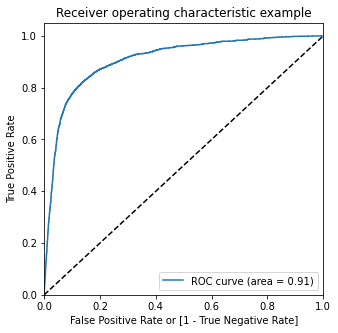

In [139]:
draw_roc(y_train_pred_final.Churn, y_train_pred_final.predicted_prob)

We have got a roc_auc score of 0.91, meaning the model has good predictive power.  But our intension is to get a good sensitivity score so let's find optimal cutoff.

Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

#### 4.22 Find optimal cutoff

In [140]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.predicted_prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Churn,predicted,predicted_prob,CustID,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0,0.125941,76985,1,1,0,0,0,0,0,0,0,0
1,0,0,0.322258,77814,1,1,1,1,0,0,0,0,0,0
2,0,0,0.105849,24787,1,1,0,0,0,0,0,0,0,0
3,0,0,0.041549,60192,1,0,0,0,0,0,0,0,0,0
4,0,0,0.063674,69896,1,0,0,0,0,0,0,0,0,0


In [141]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.086400  1.000000  0.000000
0.1   0.1  0.451945  0.972452  0.402720
0.2   0.2  0.614557  0.949862  0.582847
0.3   0.3  0.720189  0.916804  0.701594
0.4   0.4  0.792450  0.877686  0.784389
0.5   0.5  0.842957  0.837466  0.843476
0.6   0.6  0.879469  0.792287  0.887714
0.7   0.7  0.906127  0.736088  0.922207
0.8   0.8  0.922550  0.638017  0.949458
0.9   0.9  0.923216  0.364187  0.976084


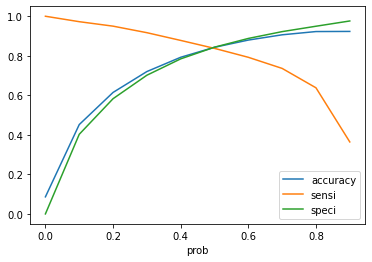

In [142]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

- As per the above table and graph 0.5 cutoff gives optimal value for sensitivity and specificity. But as per our business objective we want our model to give good sensitivity. So we'll choose a cutoff of 0.4 which gives a good sensitivity 0.877686 and a decent specificity of 0.784389.

- The auc score for train set is 0.91

In [143]:
y_train_pred_final['final_predicted'] = y_train_pred_final.predicted_prob.map( lambda x: 1 if x > 0.4 else 0)

y_train_pred_final.head()

,Churn,predicted,predicted_prob,CustID,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0,0.125941,76985,1,1,0,0,0,0,0,0,0,0,0
1,0,0,0.322258,77814,1,1,1,1,0,0,0,0,0,0,0
2,0,0,0.105849,24787,1,1,0,0,0,0,0,0,0,0,0
3,0,0,0.041549,60192,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0.063674,69896,1,0,0,0,0,0,0,0,0,0,0


In [144]:
# Get accuracy and sensitivity
print('train accuracy of logistic reg model:',metrics.accuracy_score(y_train_pred_final.Churn,y_train_pred_final.final_predicted)*100)
print('train sensitivity of logistic reg model:',metrics.recall_score(y_train_pred_final.Churn,y_train_pred_final.final_predicted)*100)

train accuracy of logistic reg model: 79.24501356690627
train sensitivity of logistic reg model: 87.76859504132231


#### 4.23  Predict for test data

In [145]:
# Now lets find the test data accuracy and sensitivity
y_test_pred = pd.DataFrame({'predicted_prob':log_model1.predict_proba(df_test_pca)[:,1]})

In [146]:
y_test_pred['Churn'] = list(y_test)
y_test_pred.head()

,predicted_prob,Churn
0,0.582970,0
1,0.030560,0
2,0.016740,0
3,0.038915,0
4,0.464302,0


In [147]:
# Apply cutoff of 0.4 on the predicted probability
y_test_pred['final_predicted'] = y_test_pred.predicted_prob.map(lambda x: 1 if x > 0.4 else 0)

In [148]:
y_test_pred = y_test_pred[['Churn','predicted_prob','final_predicted']]
y_test_pred.head()

,Churn,predicted_prob,final_predicted
0,0,0.582970,1
1,0,0.030560,0
2,0,0.016740,0
3,0,0.038915,0
4,0,0.464302,1


In [149]:
# Get accuracy and sensitivity
acc_train= metrics.accuracy_score(y_train_pred_final.Churn,y_train_pred_final.final_predicted)*100
sens_train=metrics.recall_score(y_train_pred_final.Churn,y_train_pred_final.final_predicted)*100
roc_auc_train = metrics.roc_auc_score(y_train_pred_final.Churn,y_train_pred_final.predicted_prob)*100

In [150]:
# Get accuracy , sensitivity and auc
print('test accuracy of logistic reg model:',metrics.accuracy_score(y_test_pred.Churn,y_test_pred.final_predicted)*100)
print('test sensitivity of logistic reg model:',metrics.recall_score(y_test_pred.Churn,y_test_pred.final_predicted)*100)
print('test roc_auc of logistic reg model:',metrics.roc_auc_score(y_test_pred.Churn,y_test_pred.predicted_prob)*100)

acc =  np.round(metrics.accuracy_score(y_test_pred.Churn,y_test_pred.final_predicted)*100,2)
sens = np.round(metrics.recall_score(y_test_pred.Churn,y_test_pred.final_predicted)*100,2)
roc_auc = np.round(metrics.roc_auc_score(y_test_pred.Churn,y_test_pred.predicted_prob)*100,2)


test accuracy of logistic reg model: 78.88716126166149
test sensitivity of logistic reg model: 85.08997429305913
test roc_auc of logistic reg model: 89.3464324353717


In [151]:
# Create data frame to store metric values of various models
model_metrics = pd.DataFrame({'accuracy':acc_train, 'sensitivity':sens_train, 'roc_acu':roc_auc_train },index=['Logistic_regression_train'])
model_metrics

,accuracy,sensitivity,roc_acu
Logistic_regression_train,79.245014,87.768595,90.823667


In [152]:
model_metrics.loc['Logistic_regression',:]=[acc,sens,roc_auc]
model_metrics

,accuracy,sensitivity,roc_acu
Logistic_regression_train,79.245014,87.768595,90.823667
Logistic_regression,78.890000,85.090000,89.350000


Logistic regression has given descent test sensitivity and roc_auc value, which are not much less than the train scores. Also this model is not overfitting.

### 4.3 Build Decision Tree model using principal components

In DecisionTree classifier also we will use class_weight parameter to handle class imbalance in the data.

In [153]:
# Import libraries
from sklearn.tree import DecisionTreeClassifier

accuracy: 0.7905936116532585
sensitivity: 0.8391184573002755


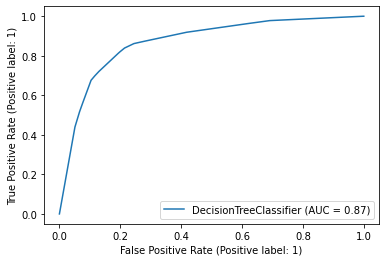

In [154]:
# Create a base learner
dt_base = DecisionTreeClassifier(random_state=42, max_depth=4,class_weight='balanced')

dt_base.fit(df_train_pca, y_train)

y_train_dt_pred = dt_base.predict(df_train_pca)
#y_test_dt_pred = dt_base.predict(df_test_pca)

print('accuracy:', metrics.accuracy_score(y_train, y_train_dt_pred))
print('sensitivity:', metrics.recall_score(y_train, y_train_dt_pred))

#### Plot the ROC curve

from sklearn.metrics import plot_roc_curve

plot_roc_curve(dt_base, df_train_pca, y_train, drop_intermediate=False)
plt.show()

We have got a 83% of sensitivity and auc of for the base DecisionTreeClassifier. We will do hyperparameter tuning to get better parameters.

###### Hyperparameter tuning

In [155]:
df_train_pca.shape

(21007, 58)

In [156]:
from sklearn.model_selection import GridSearchCV

dt = DecisionTreeClassifier(random_state=42,class_weight='balanced')

params = {
    "max_depth": [2,3,5,10,20,50,150],
    "min_samples_leaf": [5,10,20,50,100,500,1000,1500,2000,2500]
}

In [157]:
grid_search = GridSearchCV(estimator=dt,
                           param_grid=params,
                           cv=5,
                           n_jobs=-1, verbose=1, scoring="recall")

In [158]:
grid_search.fit(df_train_pca, y_train)

Fitting 5 folds for each of 70 candidates, totalling 350 fits


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 20, 50, 150],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 500, 1000,
                                              1500, 2000, 2500]},
             scoring='recall', verbose=1)

In [159]:
grid_search.best_score_


0.8782369146005509

In [160]:
dt_best = grid_search.best_estimator_
dt_best



DecisionTreeClassifier(class_weight='balanced', max_depth=2,
                       min_samples_leaf=2000, random_state=42)

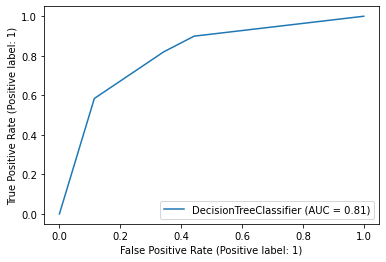

In [161]:
plot_roc_curve(dt_best, df_train_pca, y_train)
plt.show()

In [162]:
 #Fine tuning min_samples_leaf with values in the range between 1500 AND 2500

dt = DecisionTreeClassifier(random_state=42,class_weight='balanced',max_depth=2)

params = {
    "min_samples_leaf": [1600,1700,1800,2000,2200,2400]
}

grid_search = GridSearchCV(estimator=dt,
                           param_grid=params,
                           cv=5,
                           n_jobs=-1, verbose=1, scoring="recall")

grid_search.fit(df_train_pca, y_train)

grid_search.best_score_



Fitting 5 folds for each of 6 candidates, totalling 30 fits


0.8782369146005509

In [163]:
dt_best = grid_search.best_estimator_
dt_best

DecisionTreeClassifier(class_weight='balanced', max_depth=2,
                       min_samples_leaf=2000, random_state=42)

So we have best parameters as max_depth=2 and min_samples_leaf=2000

In [164]:
# Now get the prediction for train set
dt_train_predicted_prob = dt_best.predict_proba(df_train_pca)[:,1]
dt_train_predicted_prob[:5]

array([0.50847921, 0.15316224, 0.15316224, 0.83580093, 0.15316224])

In [165]:
dt_train_predicted = dt_best.predict(df_train_pca)
dt_train_predicted[:5]

array([1, 0, 0, 1, 0])

In [166]:
dt_y_train_pred_final = pd.DataFrame({'Churn':y_train,'predicted_prob':dt_train_predicted_prob})
dt_y_train_pred_final.head()

,Churn,predicted_prob
76985,0,0.508479
77814,0,0.153162
24787,0,0.153162
60192,0,0.835801
69896,0,0.153162


In [167]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    dt_y_train_pred_final[i]= dt_y_train_pred_final.predicted_prob.map(lambda x: 1 if x > i else 0)
dt_y_train_pred_final.head()

,Churn,predicted_prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
76985,0,0.508479,1,1,1,1,1,1,0,0,0,0
77814,0,0.153162,1,1,0,0,0,0,0,0,0,0
24787,0,0.153162,1,1,0,0,0,0,0,0,0,0
60192,0,0.835801,1,1,1,1,1,1,1,1,1,0
69896,0,0.153162,1,1,0,0,0,0,0,0,0,0


In [168]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(dt_y_train_pred_final.Churn, dt_y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.086400  1.000000  0.000000
0.1   0.1  0.086400  1.000000  0.000000
0.2   0.2  0.586995  0.899174  0.557472
0.3   0.3  0.586995  0.899174  0.557472
0.4   0.4  0.586995  0.899174  0.557472
0.5   0.5  0.670919  0.820386  0.656784
0.6   0.6  0.859237  0.584022  0.885265
0.7   0.7  0.859237  0.584022  0.885265
0.8   0.8  0.859237  0.584022  0.885265
0.9   0.9  0.913600  0.000000  1.000000


In [169]:
# It looks like cut off of 0.5 is better to give a good sensitivity of 0.82
dt_y_train_pred_final['final_predicted'] = dt_train_predicted

dt_y_train_pred_final.head()

,Churn,predicted_prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
76985,0,0.508479,1,1,1,1,1,1,0,0,0,0,1
77814,0,0.153162,1,1,0,0,0,0,0,0,0,0,0
24787,0,0.153162,1,1,0,0,0,0,0,0,0,0,0
60192,0,0.835801,1,1,1,1,1,1,1,1,1,0,1
69896,0,0.153162,1,1,0,0,0,0,0,0,0,0,0


In [170]:
# Get accuracy and sensitivity
print('train accuracy of decision tree model:',metrics.accuracy_score(dt_y_train_pred_final.Churn,dt_y_train_pred_final.final_predicted)*100)
print('train sensitivity of decision tree model:',metrics.recall_score(dt_y_train_pred_final.Churn,dt_y_train_pred_final.final_predicted)*100)
print('roc_auc score of decision tree model:',metrics.roc_auc_score(dt_y_train_pred_final.Churn,dt_y_train_pred_final.predicted_prob)*100)



train accuracy of decision tree model: 67.09192174037226
train sensitivity of decision tree model: 82.03856749311295
roc_auc score of decision tree model: 80.86984705518942


###### Predict for test set

In [171]:
# Now lets find the test data accuracy and sensitivity
dt_y_test_pred = pd.DataFrame({'predicted_prob':dt_best.predict_proba(df_test_pca)[:,1]})

dt_y_test_pred['Churn'] = list(y_test)
dt_y_test_pred.head()


,predicted_prob,Churn
0,0.835801,0
1,0.153162,0
2,0.442380,0
3,0.153162,0
4,0.442380,0


In [172]:
# Apply cutoff of 0.5 on the predicted probability
dt_y_test_pred['final_predicted'] = dt_best.predict(df_test_pca)

dt_y_test_pred = dt_y_test_pred[['Churn','predicted_prob','final_predicted']]
dt_y_test_pred.head()

,Churn,predicted_prob,final_predicted
0,0,0.835801,1
1,0,0.153162,0
2,0,0.442380,0
3,0,0.153162,0
4,0,0.442380,0


In [173]:
dt_y_train_pred_final.head()

,Churn,predicted_prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
76985,0,0.508479,1,1,1,1,1,1,0,0,0,0,1
77814,0,0.153162,1,1,0,0,0,0,0,0,0,0,0
24787,0,0.153162,1,1,0,0,0,0,0,0,0,0,0
60192,0,0.835801,1,1,1,1,1,1,1,1,1,0,1
69896,0,0.153162,1,1,0,0,0,0,0,0,0,0,0


In [174]:
# Get accuracy , sensitivity and auc
acc_train =  np.round(metrics.accuracy_score(dt_y_train_pred_final.Churn,dt_y_train_pred_final.final_predicted)*100,2)
sens_train = np.round(metrics.recall_score(dt_y_train_pred_final.Churn,dt_y_train_pred_final.final_predicted)*100,2)
roc_auc_train = np.round(metrics.roc_auc_score(dt_y_train_pred_final.Churn,dt_y_train_pred_final.predicted_prob)*100,2)


In [175]:
# Update model_metrics data frame that store metric values 
model_metrics.loc['DecisionTree_train',:] = [acc_train,sens_train,roc_auc_train]
model_metrics

,accuracy,sensitivity,roc_acu
Logistic_regression_train,79.245014,87.768595,90.823667
Logistic_regression,78.890000,85.090000,89.350000
DecisionTree_train,67.090000,82.040000,80.870000


In [176]:
# Get accuracy , sensitivity and auc
acc =  np.round(metrics.accuracy_score(dt_y_test_pred.Churn,dt_y_test_pred.final_predicted)*100,2)
sens = np.round(metrics.recall_score(dt_y_test_pred.Churn,dt_y_test_pred.final_predicted)*100,2)
roc_auc = np.round(metrics.roc_auc_score(dt_y_test_pred.Churn,dt_y_test_pred.predicted_prob)*100,2)


In [177]:
# Update model_metrics data frame that store metric values 
model_metrics.loc['DecisionTree',:] = [acc,sens,roc_auc]
model_metrics

,accuracy,sensitivity,roc_acu
Logistic_regression_train,79.245014,87.768595,90.823667
Logistic_regression,78.890000,85.090000,89.350000
DecisionTree_train,67.090000,82.040000,80.870000
DecisionTree,66.550000,81.620000,80.980000


Decision Tree has given less performance than Logistic regression model. There is not much difference between train and test sensitivity score of DT model. Model is not overfitting

### 4.4 Random Forest model using principal components


In [178]:
# Create a base RandomForestClassifier model
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=10, max_depth=4, max_features=5, random_state=100, 
                            oob_score=True,class_weight='balanced')

rf.fit(df_train_pca, y_train)

rf.oob_score_



0.7434188603798734

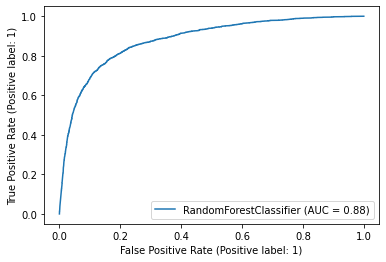

In [179]:
plot_roc_curve(rf, df_train_pca, y_train)
plt.show()

##### Hyper-parameter tuning for the Random Forest


In [180]:
rf = RandomForestClassifier(random_state=42, n_jobs=-1,class_weight='balanced')

params = {
    'max_depth': [2,3,5,10],
    'min_samples_leaf': [100,200,500,1000,2000],
    'n_estimators': [10, 25, 50, 100]
}

grid_search = GridSearchCV(estimator=rf,
                           param_grid=params,
                           cv = 5,
                           n_jobs=-1, verbose=1, scoring="recall")


In [181]:

%%time
grid_search.fit(df_train_pca, y_train)


Fitting 5 folds for each of 80 candidates, totalling 400 fits
CPU times: user 6.29 s, sys: 247 ms, total: 6.54 s
Wall time: 2min 17s


GridSearchCV(cv=5,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10],
                         'min_samples_leaf': [100, 200, 500, 1000, 2000],
                         'n_estimators': [10, 25, 50, 100]},
             scoring='recall', verbose=1)

In [182]:
grid_search.best_score_

0.8071625344352616

In [183]:

rf_best = grid_search.best_estimator_
rf_best


RandomForestClassifier(class_weight='balanced', max_depth=3,
                       min_samples_leaf=2000, n_jobs=-1, random_state=42)

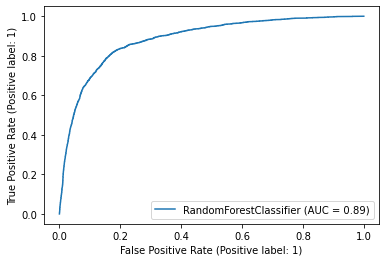

In [184]:

plot_roc_curve(rf_best, df_train_pca, y_train)
plt.show()

In [185]:
# Now get the prediction for train set
rf_train_predicted_prob = rf_best.predict_proba(df_train_pca)[:,1]
rf_train_predicted_prob[:5]


array([0.47820619, 0.3908039 , 0.35668646, 0.49677142, 0.3489321 ])

In [186]:
rf_train_predicted = rf_best.predict(df_train_pca)
rf_train_predicted[:5]


array([0, 0, 0, 0, 0])

In [187]:
rf_y_train_pred_final = pd.DataFrame({'Churn':y_train,'predicted_prob':rf_train_predicted_prob})
rf_y_train_pred_final.head()


,Churn,predicted_prob
76985,0,0.478206
77814,0,0.390804
24787,0,0.356686
60192,0,0.496771
69896,0,0.348932


In [188]:

# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    rf_y_train_pred_final[i]= rf_y_train_pred_final.predicted_prob.map(lambda x: 1 if x > i else 0)
rf_y_train_pred_final.head()

,Churn,predicted_prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
76985,0,0.478206,1,1,1,1,1,0,0,0,0,0
77814,0,0.390804,1,1,1,1,0,0,0,0,0,0
24787,0,0.356686,1,1,1,1,0,0,0,0,0,0
60192,0,0.496771,1,1,1,1,1,0,0,0,0,0
69896,0,0.348932,1,1,1,1,0,0,0,0,0,0


In [189]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(rf_y_train_pred_final.Churn, rf_y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.086400  1.000000  0.000000
0.1   0.1  0.086400  1.000000  0.000000
0.2   0.2  0.086400  1.000000  0.000000
0.3   0.3  0.098205  1.000000  0.012922
0.4   0.4  0.493645  0.959780  0.449562
0.5   0.5  0.818108  0.823140  0.817632
0.6   0.6  0.917885  0.436915  0.963370
0.7   0.7  0.913648  0.000551  1.000000
0.8   0.8  0.913600  0.000000  1.000000
0.9   0.9  0.913600  0.000000  1.000000


In [190]:
# It looks like cut off of 0.5 is better to give a good sensitivity of 0.82
rf_y_train_pred_final['final_predicted'] = rf_train_predicted

dt_y_train_pred_final.head()

,Churn,predicted_prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
76985,0,0.508479,1,1,1,1,1,1,0,0,0,0,1
77814,0,0.153162,1,1,0,0,0,0,0,0,0,0,0
24787,0,0.153162,1,1,0,0,0,0,0,0,0,0,0
60192,0,0.835801,1,1,1,1,1,1,1,1,1,0,1
69896,0,0.153162,1,1,0,0,0,0,0,0,0,0,0


In [191]:
# Get accuracy and sensitivity
print('train accuracy of RF model:',metrics.accuracy_score(rf_y_train_pred_final.Churn,rf_y_train_pred_final.final_predicted)*100)
print('train sensitivity of RF model:',metrics.recall_score(rf_y_train_pred_final.Churn,rf_y_train_pred_final.final_predicted)*100)
print('roc_auc score of RF model:',metrics.roc_auc_score(rf_y_train_pred_final.Churn,rf_y_train_pred_final.predicted_prob)*100)



train accuracy of RF model: 81.81082496310754
train sensitivity of RF model: 82.31404958677686
roc_auc score of RF model: 88.5060393047149


- Train accuracy,sensitivity and roc_auc scores are better for Random Forest model compared to Decision Tree model

###### Predict for test set

In [192]:
# Now lets find the test data accuracy and sensitivity
rf_y_test_pred = pd.DataFrame({'predicted_prob':rf_best.predict_proba(df_test_pca)[:,1]})

rf_y_test_pred['Churn'] = list(y_test)
rf_y_test_pred.head()

,predicted_prob,Churn
0,0.567965,0
1,0.356768,0
2,0.523726,0
3,0.348515,0
4,0.432812,0


In [193]:

# Apply cutoff of 0.5 on the predicted probability
rf_y_test_pred['final_predicted'] = rf_best.predict(df_test_pca)

rf_y_test_pred = rf_y_test_pred[['Churn','predicted_prob','final_predicted']]
rf_y_test_pred.head()

,Churn,predicted_prob,final_predicted
0,0,0.567965,1
1,0,0.356768,0
2,0,0.523726,1
3,0,0.348515,0
4,0,0.432812,0


In [194]:
acc_train = metrics.accuracy_score(rf_y_train_pred_final.Churn,rf_y_train_pred_final.final_predicted)*100
sens_train = metrics.recall_score(rf_y_train_pred_final.Churn,rf_y_train_pred_final.final_predicted)*100
roc_auc_train = metrics.roc_auc_score(rf_y_train_pred_final.Churn,rf_y_train_pred_final.predicted_prob)*100

In [195]:
# Update model_metrics data frame that store metric values 
model_metrics.loc['RandomForest_train',:] = [acc_train,sens_train,roc_auc_train]
model_metrics

,accuracy,sensitivity,roc_acu
Logistic_regression_train,79.245014,87.768595,90.823667
Logistic_regression,78.890000,85.090000,89.350000
DecisionTree_train,67.090000,82.040000,80.870000
DecisionTree,66.550000,81.620000,80.980000
RandomForest_train,81.810825,82.314050,88.506039


In [196]:

# Get accuracy , sensitivity and auc
acc =  np.round(metrics.accuracy_score(rf_y_test_pred.Churn,rf_y_test_pred.final_predicted)*100,2)
sens = np.round(metrics.recall_score(rf_y_test_pred.Churn,rf_y_test_pred.final_predicted)*100,2)
roc_auc = np.round(metrics.roc_auc_score(rf_y_test_pred.Churn,rf_y_test_pred.predicted_prob)*100,2)


In [197]:
# Update model_metrics data frame that store metric values 
model_metrics.loc['RandomForest',:] = [acc,sens,roc_auc]
model_metrics

,accuracy,sensitivity,roc_acu
Logistic_regression_train,79.245014,87.768595,90.823667
Logistic_regression,78.890000,85.090000,89.350000
DecisionTree_train,67.090000,82.040000,80.870000
DecisionTree,66.550000,81.620000,80.980000
RandomForest_train,81.810825,82.314050,88.506039
RandomForest,82.020000,79.690000,87.660000


Even though our roc_auc score has increased for RandomForest as compared to DecisionTree model, our sensitivity has dropped here. Our Logistic regression model is the best performing model till now with goof sensitivity and roc_auc score.

### 4.5 XGBoost model using principal components


Let's try a boosting model also for telecom churn prediction. 

In xgboost we can use scale_pos_weight parameter to balance the class and deal with imbalance.

In [198]:
#Find scale_pos_weight to be given in the classifier

estimate = y_train.value_counts()[0] /y_train.value_counts()[1]
estimate

10.574104683195593

In [199]:
import xgboost as xgb

xgclf = xgb.XGBClassifier(scale_pos_weight=estimate,random_state=42)

xgclf.fit(df_train_pca, y_train)

XGBClassifier(random_state=42, scale_pos_weight=10.574104683195593)

In [200]:
print('accuracy on train data by XGBoost =', metrics.accuracy_score(y_train,xgclf.predict(df_train_pca)))
print('recall on train data by XGBoost =', metrics.recall_score(y_train,xgclf.predict(df_train_pca)))
print('AUC on train data by XGBoost =', metrics.roc_auc_score(y_train,xgclf.predict_proba(df_train_pca)[:, 1]))

print('accuracy on test data by XGBoost =', metrics.accuracy_score(y_test,xgclf.predict(df_test_pca)))
print('recall on test data by XGBoost =', metrics.recall_score(y_test,xgclf.predict(df_test_pca)))
print('AUC on test data by XGBoost =', metrics.roc_auc_score(y_test,xgclf.predict_proba(df_test_pca)[:, 1]))


accuracy on train data by XGBoost = 0.8699957157138097
recall on train data by XGBoost = 0.8699724517906336
AUC on train data by XGBoost = 0.9423502188124758
accuracy on test data by XGBoost = 0.8563971568191915
recall on test data by XGBoost = 0.7776349614395887
AUC on test data by XGBoost = 0.8916699011285928


It looks like the model is overfitting with the default values. We will do tuning for hyperparameters.

In [201]:
# Now let's do hyper parameter tuning for xgbclassifier
# 1st-Run for best hyperparameters

xgb_model = xgb.XGBClassifier(scale_pos_weight=estimate,random_state=42,n_jobs=-1) # using default value

parameters = {#'learning_rate': [0.1, 0.2, 0.3],
              'max_depth': [2, 4, 6],
          #    'min_child_weight': [1,3, 7, 11],
              'n_estimators': [50, 100, 150]}

scorer = metrics.make_scorer(metrics.recall_score,
                             greater_is_better=True,
                             needs_proba=True,
                             needs_threshold=False)

clf_xgb = GridSearchCV(estimator=xgb_model,
                                       param_grid=parameters,
                                       n_jobs=-1,
                                       cv=3,
                                       scoring=scorer,
                                       refit=True,verbose=True)

clf_xgb.fit(df_train_pca, y_train)

Fitting 3 folds for each of 9 candidates, totalling 27 fits


GridSearchCV(cv=3,
             estimator=XGBClassifier(n_jobs=-1, random_state=42,
                                     scale_pos_weight=10.574104683195593),
             n_jobs=-1,
             param_grid={'max_depth': [2, 4, 6],
                         'n_estimators': [50, 100, 150]},
             scoring=make_scorer(recall_score, needs_proba=True), verbose=True)

In [202]:
clf_xgb.best_estimator_

XGBClassifier(max_depth=2, n_estimators=50, n_jobs=-1, random_state=42,
              scale_pos_weight=10.574104683195593)

In [203]:
clf_xgb.best_params_

{'max_depth': 2, 'n_estimators': 50}

In [204]:
# Due to the lack of resources we can't do more tuning here. So taking the values from the above result as best
# hyperparameters
xgb_best = clf_xgb.best_estimator_

In [205]:
# Now get the prediction for train set
xgb_train_predicted_prob = xgb_best.predict_proba(df_train_pca)[:,1]
xgb_train_predicted_prob[:5]

array([0.38262564, 0.34926623, 0.09585497, 0.7178528 , 0.07570022],
      dtype=float32)

In [206]:
# Predict with 0.5 cutoff
xgb_train_predicted = xgb_best.predict(df_train_pca)
xgb_train_predicted[:5]

array([0, 0, 0, 1, 0])

In [207]:
# Store probability
xgb_y_train_pred_final = pd.DataFrame({'Churn':y_train,'predicted_prob':xgb_train_predicted_prob})
xgb_y_train_pred_final.head()


,Churn,predicted_prob
76985,0,0.382626
77814,0,0.349266
24787,0,0.095855
60192,0,0.717853
69896,0,0.075700


In [208]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    xgb_y_train_pred_final[i]= xgb_y_train_pred_final.predicted_prob.map(lambda x: 1 if x > i else 0)
xgb_y_train_pred_final.head()

,Churn,predicted_prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
76985,0,0.382626,1,1,1,1,0,0,0,0,0,0
77814,0,0.349266,1,1,1,1,0,0,0,0,0,0
24787,0,0.095855,1,0,0,0,0,0,0,0,0,0
60192,0,0.717853,1,1,1,1,1,1,1,1,0,0
69896,0,0.075700,1,0,0,0,0,0,0,0,0,0


In [209]:

# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(xgb_y_train_pred_final.Churn, xgb_y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.086400  1.000000  0.000000
0.1   0.1  0.221640  0.996694  0.148343
0.2   0.2  0.502642  0.969697  0.458472
0.3   0.3  0.671586  0.925069  0.647614
0.4   0.4  0.779454  0.879890  0.769956
0.5   0.5  0.845956  0.829201  0.847541
0.6   0.6  0.885752  0.763636  0.897301
0.7   0.7  0.910744  0.665565  0.933931
0.8   0.8  0.925263  0.507989  0.964725
0.9   0.9  0.920027  0.130579  0.994685


In [210]:
# It looks like cut off of 0.4 is better to give a good sensitivity of 0.87 without compromising much on specificity

xgb_y_train_pred_final['final_predicted'] = xgb_y_train_pred_final.predicted_prob.map( lambda x: 1 if x > 0.4 else 0)

xgb_y_train_pred_final.head()


,Churn,predicted_prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
76985,0,0.382626,1,1,1,1,0,0,0,0,0,0,0
77814,0,0.349266,1,1,1,1,0,0,0,0,0,0,0
24787,0,0.095855,1,0,0,0,0,0,0,0,0,0,0
60192,0,0.717853,1,1,1,1,1,1,1,1,0,0,1
69896,0,0.075700,1,0,0,0,0,0,0,0,0,0,0


In [211]:
# Get meteric scores for train
print('accuracy on train data by XGBoost =', metrics.accuracy_score(xgb_y_train_pred_final.Churn,xgb_y_train_pred_final.final_predicted))
print('recall on train data by XGBoost =', metrics.recall_score(xgb_y_train_pred_final.Churn,xgb_y_train_pred_final.final_predicted))
print('AUC on train data by XGBoost =', metrics.roc_auc_score(xgb_y_train_pred_final.Churn,xgb_y_train_pred_final.predicted_prob))


accuracy on train data by XGBoost = 0.779454467558433
recall on train data by XGBoost = 0.8798898071625344
AUC on train data by XGBoost = 0.9059079799089841


###### Predict for test data

In [212]:
# Now lets find the test data accuracy and sensitivity
xgb_y_test_pred = pd.DataFrame({'predicted_prob':xgb_best.predict_proba(df_test_pca)[:,1]})

xgb_y_test_pred['Churn'] = list(y_test)


# Apply cutoff of 0.4 on the predicted probability
xgb_y_test_pred['final_predicted'] = xgb_y_test_pred.predicted_prob.map(lambda x: 1 if x > 0.4 else 0)

xgb_y_test_pred = xgb_y_test_pred[['Churn','predicted_prob','final_predicted']]
xgb_y_test_pred.head()

,Churn,predicted_prob,final_predicted
0,0,0.575229,1
1,0,0.117673,0
2,0,0.268099,0
3,0,0.137631,0
4,0,0.236167,0


In [213]:

print('accuracy on test data by XGBoost =', metrics.accuracy_score(xgb_y_test_pred.Churn,xgb_y_test_pred.final_predicted))
print('recall on test data by XGBoost =', metrics.recall_score(xgb_y_test_pred.Churn,xgb_y_test_pred.final_predicted))
print('AUC on test data by XGBoost =', metrics.roc_auc_score(xgb_y_test_pred.Churn,xgb_y_test_pred.predicted_prob))


accuracy on test data by XGBoost = 0.7742114615726344
recall on test data by XGBoost = 0.8457583547557841
AUC on test data by XGBoost = 0.885382935291386


In [214]:
acc_train = metrics.accuracy_score(xgb_y_train_pred_final.Churn,xgb_y_train_pred_final.final_predicted)*100
sens_train = metrics.recall_score(xgb_y_train_pred_final.Churn,xgb_y_train_pred_final.final_predicted)*100
roc_auc_train = metrics.roc_auc_score(xgb_y_train_pred_final.Churn,xgb_y_train_pred_final.predicted_prob)*100

# Update model_metrics data frame that store metric values 
model_metrics.loc['XGBoost_train',:] = [acc_train,sens_train,roc_auc_train]
model_metrics


,accuracy,sensitivity,roc_acu
Logistic_regression_train,79.245014,87.768595,90.823667
Logistic_regression,78.890000,85.090000,89.350000
DecisionTree_train,67.090000,82.040000,80.870000
DecisionTree,66.550000,81.620000,80.980000
RandomForest_train,81.810825,82.314050,88.506039
RandomForest,82.020000,79.690000,87.660000
XGBoost_train,77.945447,87.988981,90.590798


In [215]:


# Get accuracy , sensitivity and auc
acc =  np.round(metrics.accuracy_score(xgb_y_test_pred.Churn,xgb_y_test_pred.final_predicted)*100,2)
sens = np.round(metrics.recall_score(xgb_y_test_pred.Churn,xgb_y_test_pred.final_predicted)*100,2)
roc_auc = np.round(metrics.roc_auc_score(xgb_y_test_pred.Churn,xgb_y_test_pred.predicted_prob)*100,2)


# Update model_metrics data frame that store metric values 
model_metrics.loc['XGBoost',:] = [acc,sens,roc_auc]
model_metrics

,accuracy,sensitivity,roc_acu
Logistic_regression_train,79.245014,87.768595,90.823667
Logistic_regression,78.890000,85.090000,89.350000
DecisionTree_train,67.090000,82.040000,80.870000
DecisionTree,66.550000,81.620000,80.980000
RandomForest_train,81.810825,82.314050,88.506039
RandomForest,82.020000,79.690000,87.660000
XGBoost_train,77.945447,87.988981,90.590798
XGBoost,77.420000,84.580000,88.540000


With a better hyperparameter tuning XGBoost would have given a better result.

###### As it is important for business to identify all positive/churn customers, we take sensitivity/recall as our scoring metric to find best model. At the same time it is important to check roc_auc score as it is an indication of goodness of a model. Considering the fact that we ran hyperparameter tuning with our limited resources, amongst all models, Logistic regression is the best performing model with 85% recall and 89% roc_auc score values on test data. This model is also the best as it is not overfitting.

## 5: Recommendations


In [216]:
# Get the dataframe contating important variables
imp_df

,Varname,Coefficients,coef_mag
0,last_day_rch_amt_8,-0.745,0.745
1,loc_ic_t2m_mou_8,-0.677,0.677
2,avg_rech_amt_goodphase,0.602,0.602
3,last_rech_days_8,0.488,0.488
4,loc_og_mou_8,-0.466,0.466
5,loc_ic_mou_7,0.441,0.441
6,total_og_mou_8,-0.427,0.427
7,loc_ic_t2f_mou_8,-0.387,0.387
8,monthly_3g_8,-0.384,0.384
9,loc_ic_t2t_mou_8,-0.381,0.381


#### Action Phase Attributes :
- As we can see from top 14 attributes are all from action phase as we saw this while EDA also customer who are most likely to churn shows alll kind of fall , decrease and reduction in usage , recharge and Amount of revenue generated from them hence this behaviour is commmon for all the churners hence the firm should make strategies to retain the customers who show's this kind of behaviour.

- Some Strategies Suggested :
    - some behaviour that telecom industry should keep an eye on are already mentioned in EDA 
    - Reduction in incoming calls and outgoing calls is one of the sign that the customer is about to churn 
    - customer who are not recharging for data in 8th month are mostly trying to swtich 
    - The best time to offer the customers any Deal is 8th month as this might make them rethink the switching 
    